In [1]:
#mkdir tema2_SalaryPrediction

In [2]:
#mkdir tema2_Credit_Risk

In [3]:
#mkdir res-id3

Libraries

In [4]:
from __future__ import annotations
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, multilabel_confusion_matrix
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from typing import Optional, Dict, Callable
from graphviz import Digraph, Source
from IPython.display import display as idisplay
from random import randrange
plt.rcParams['figure.max_open_warning'] = 50
import numpy as np
from typing import Optional, Dict, Callable
from graphviz import Digraph, Source
from IPython.display import display as idisplay
from graphviz import Source
from copy import deepcopy
import math
import sklearn
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score
from typing import List

In [5]:
MIN_SAMPLES_PER_NODE = 2
MAX_DEPTH = 3

Extragem valorile categorice si numerice atat din train cat si din test

In [6]:
filename_train = f"tema2_Credit_Risk/credit_risk_train.csv"
filename_test = f"tema2_Credit_Risk/credit_risk_test.csv"

df_train = pd.read_csv(filename_train)
df_test = pd.read_csv(filename_test)

In [7]:
filename_train_s = f"tema2_SalaryPrediction/SalaryPrediction_train.csv"
filename_test_s = f"tema2_SalaryPrediction/SalaryPrediction_test.csv"

df_train_s = pd.read_csv(filename_train_s)
df_test_s = pd.read_csv(filename_test_s)

Tabel pentru atribute numerice atat pentru train cat si pentru test pentru Credit_Risk

In [8]:
# train
numeric_attributes = df_train.select_dtypes(include='number')
numeric_statistics = numeric_attributes.describe()
categorical_attributes = df_train.select_dtypes(include=['object', 'category'])

print(numeric_statistics.to_string())

         loan_rate   loan_amount  job_tenure_years  credit_history_length_years  applicant_age  applicant_income  loan_income_ratio  credit_history_length_months
count  7257.000000  8.000000e+03       7786.000000                  8000.000000    8000.000000      8.000000e+03        8000.000000                   7200.000000
mean     11.011079  3.887819e+07          4.729001                     5.857500      27.789125      6.566213e+04           0.170444                     76.449861
std       3.274046  2.845087e+08          4.203528                     4.096497       6.464200      5.883553e+04           0.106908                     49.434906
min       5.420000  5.000000e+02          0.000000                     2.000000      20.000000      4.200000e+03           0.000000                     25.000000
25%       7.880000  5.000000e+03          2.000000                     3.000000      23.000000      3.840000e+04           0.090000                     41.000000
50%      10.990000  8.000000

In [9]:
# test
numeric_attributes_test = df_test.select_dtypes(include='number')
numeric_statistics_test = numeric_attributes_test.describe()
categorical_attributes_test = df_test.select_dtypes(include=['object', 'category'])

print(numeric_statistics_test.to_string())

         loan_rate   loan_amount  job_tenure_years  credit_history_length_years  applicant_age  applicant_income  loan_income_ratio  credit_history_length_months
count  1803.000000  2.000000e+03       1950.000000                  2000.000000    2000.000000       2000.000000        2000.000000                   2000.000000
mean     10.991481  3.660534e+07          5.012308                     5.625500      27.569000      66022.531000           0.168875                     73.562000
std       3.236259  2.637011e+08          4.899802                     3.854955       5.924001      48662.377321           0.106456                     46.333018
min       5.420000  5.000000e+02          0.000000                     2.000000      20.000000       8088.000000           0.010000                     25.000000
25%       7.900000  5.000000e+03          2.000000                     3.000000      23.000000      39540.000000           0.090000                     40.000000
50%      10.990000  8.000000

Tabel pentru atribute numerice cat si categorice atat pentru train cat si pentru test pentru SalaryPrediction

In [10]:
# train
numeric_attributes_s = df_train_s.select_dtypes(include='number')
numeric_statistics_s = numeric_attributes_s.describe()
categorical_attributes_s = df_train_s.select_dtypes(include=['object', 'category'])

print(numeric_statistics_s.to_string())

                fnl          hpw          gain      edu_int        years         loss           prod
count  7.999000e+03  7199.000000   7999.000000  7999.000000  7999.000000  7999.000000    7999.000000
mean   1.904565e+05    40.307404   1005.272659    13.975247    38.722465    77.485436    2065.810101
std    1.064185e+05    12.519197   7164.778566    23.867180    13.708618   378.352748   14329.484489
min    1.921400e+04     1.000000      0.000000     1.000000    17.000000     0.000000     -28.000000
25%    1.182210e+05    40.000000      0.000000     9.000000    28.000000     0.000000      42.000000
50%    1.783530e+05    40.000000      0.000000    10.000000    37.000000     0.000000      57.000000
75%    2.380305e+05    45.000000      0.000000    13.000000    48.000000     0.000000      77.000000
max    1.455435e+06    99.000000  99999.000000   205.000000    90.000000  3770.000000  200110.000000


In [11]:
# test
numeric_attributes_test_s = df_test_s.select_dtypes(include='number')
numeric_statistics_test_s = numeric_attributes_test_s.describe()
categorical_attributes_test_s = df_test_s.select_dtypes(include=['object', 'category'])

print(numeric_statistics_test_s.to_string())

                fnl          hpw          gain      edu_int        years         loss           prod
count  2.000000e+03  2000.000000   2000.000000  2000.000000  2000.000000  2000.000000    2000.000000
mean   1.899384e+05    40.808000    878.189000    15.409000    38.344500   110.612000    1811.423000
std    1.046944e+05    12.506012   6319.720849    28.073257    13.889394   450.475394   12639.843777
min    2.162600e+04     1.000000      0.000000     1.000000    17.000000     0.000000     -28.000000
25%    1.183662e+05    40.000000      0.000000     9.000000    27.000000     0.000000      40.750000
50%    1.794295e+05    40.000000      0.000000    10.000000    37.000000     0.000000      57.000000
75%    2.345438e+05    45.000000      0.000000    13.000000    47.250000     0.000000      77.000000
max    1.033222e+06    99.000000  99999.000000   206.000000    90.000000  2824.000000  200125.000000


Boxplot pentru atribute numerice atat din train cat si din test pentru Credit_Risk

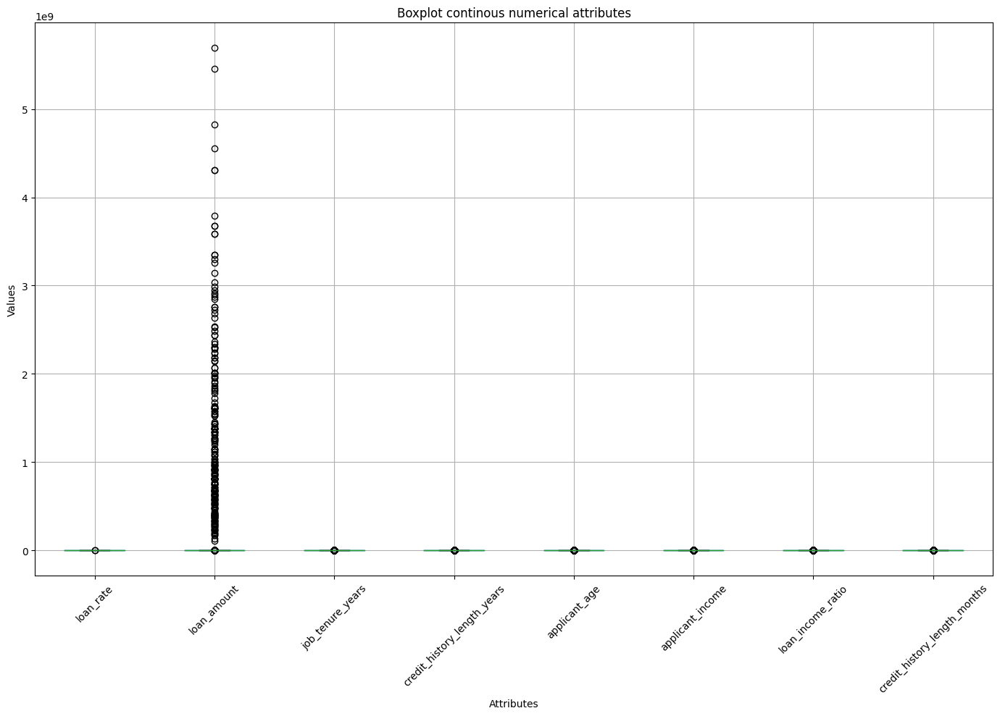

In [12]:
#train
numeric_attributes.boxplot(figsize=(14, 10))
plt.title('Boxplot continous numerical attributes')
plt.xlabel('Attributes')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

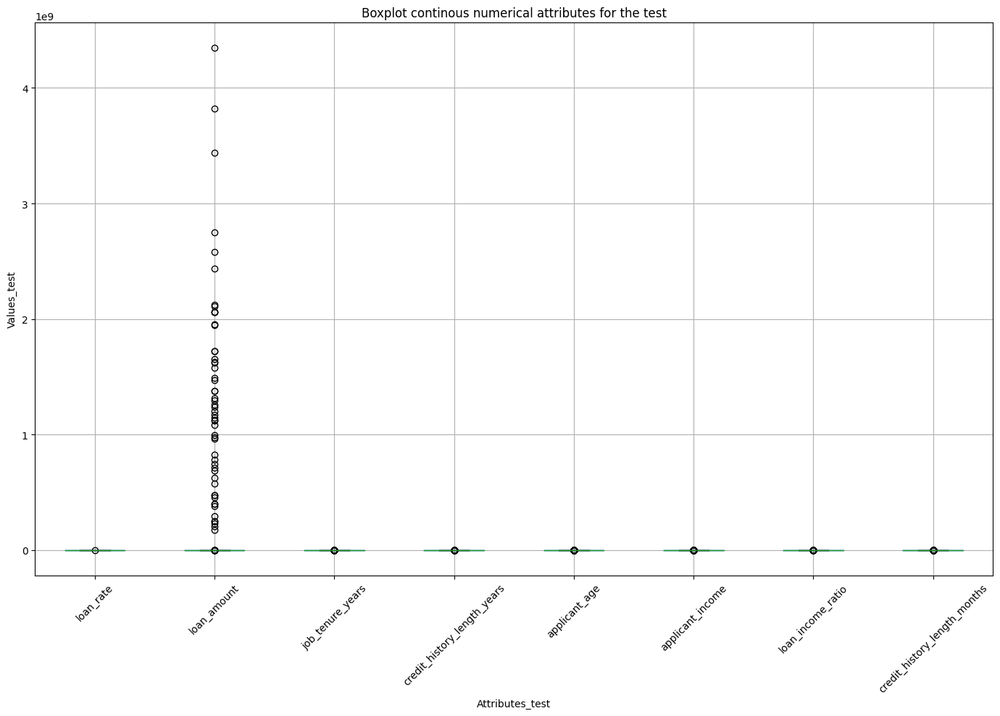

In [13]:
#test
numeric_attributes_test.boxplot(figsize=(14,10))
plt.title('Boxplot continous numerical attributes for the test')
plt.xlabel('Attributes_test')
plt.ylabel('Values_test')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Boxplot pentru atribute numerice pentru train si test pentr Salary_Prediction

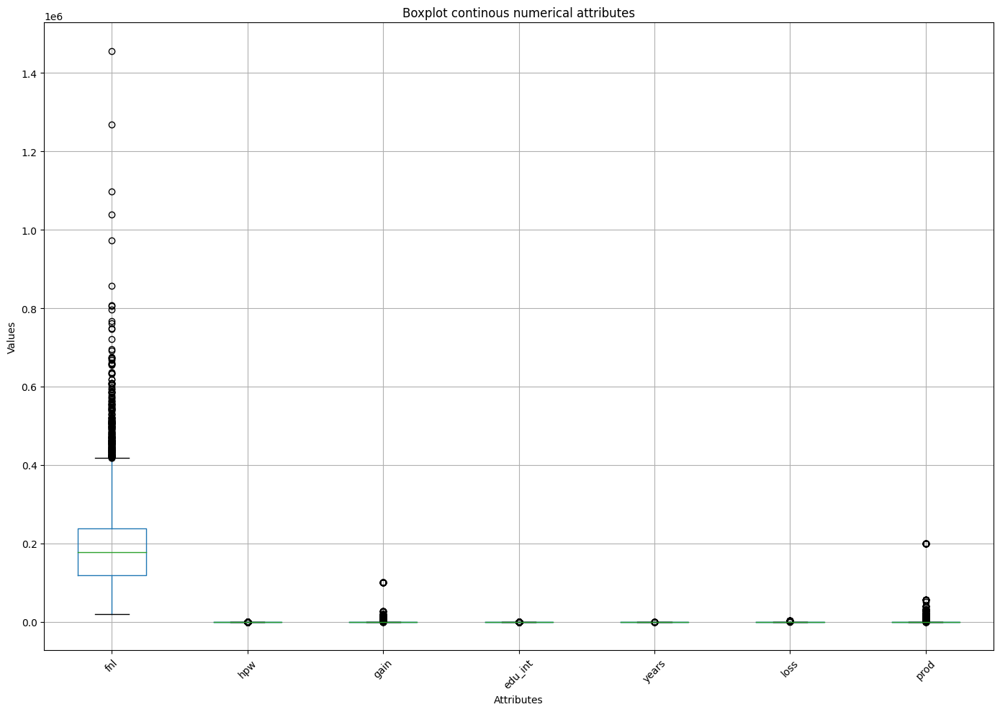

In [14]:
numeric_attributes_s.boxplot(figsize=(14, 10))
plt.title('Boxplot continous numerical attributes')
plt.xlabel('Attributes')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

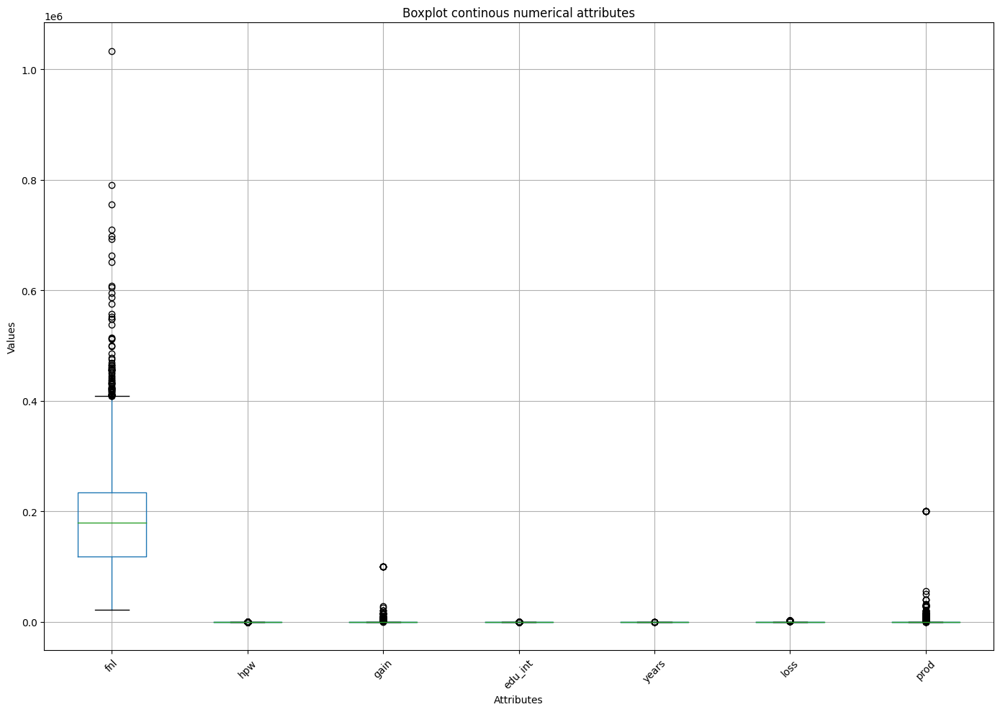

In [15]:
numeric_attributes_test_s.boxplot(figsize=(14, 10))
plt.title('Boxplot continous numerical attributes')
plt.xlabel('Attributes')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Tabel pentru valori ordinale atat pentru train cat si pentru test pentru Credit_Risk

In [16]:
df_train_dict = df_train.to_dict()

results = pd.DataFrame(columns=['Atribut', 'Numar de Exemple', 'Numar de valori unice'])

for attribute in df_train_dict:
    count_whole_examples = df_train[attribute].count()
    count_uniques = df_train[attribute].nunique()

    results = results._append({'Atribut' : attribute, 'Număr de Exemple': count_whole_examples, 'Număr de Valori Unice': count_uniques}, ignore_index=True)

results = results.dropna(axis=1, how='all')

print(results.to_string())

                          Atribut  Număr de Exemple  Număr de Valori Unice
0              residential_status            8000.0                    4.0
1                       loan_rate            7257.0                  300.0
2                     loan_amount            8000.0                  628.0
3                    loan_purpose            8000.0                    6.0
4                job_tenure_years            7786.0                   30.0
5     credit_history_length_years            8000.0                   29.0
6                   applicant_age            8000.0                   52.0
7                applicant_income            8000.0                 1641.0
8                     loan_rating            8000.0                    7.0
9   credit_history_default_status            7200.0                    2.0
10              loan_income_ratio            8000.0                   68.0
11               stability_rating            8000.0                    4.0
12   credit_history_lengt

In [17]:
df_test_dict = df_test.to_dict()

results_test = pd.DataFrame(columns=['Atribut', 'Numar de Exemple', 'Numar de valori unice'])

for attribute in df_test_dict:
    count_whole_examples = df_test[attribute].count()
    count_uniques = df_test[attribute].nunique()

    results_test = results_test._append({'Atribut' : attribute, 'Număr de Exemple': count_whole_examples, 'Număr de Valori Unice': count_uniques}, ignore_index=True)

results_test = results_test.dropna(axis=1, how='all')
print(results_test.to_string())

                          Atribut  Număr de Exemple  Număr de Valori Unice
0              residential_status            2000.0                    4.0
1                       loan_rate            1803.0                  229.0
2                     loan_amount            2000.0                  298.0
3                    loan_purpose            2000.0                    6.0
4                job_tenure_years            1950.0                   29.0
5     credit_history_length_years            2000.0                   22.0
6                   applicant_age            2000.0                   37.0
7                applicant_income            2000.0                  597.0
8                     loan_rating            2000.0                    7.0
9   credit_history_default_status            2000.0                    2.0
10              loan_income_ratio            2000.0                   61.0
11               stability_rating            2000.0                    4.0
12   credit_history_lengt

Tabel pentru valori ordinale atat pentru train cat si pentru test pentru Salary_Prediction

In [18]:
df_train_s_dict = df_train_s.to_dict()

results_s = pd.DataFrame(columns=['Atribut', 'Numar de Exemple', 'Numar de valori unice'])

for attribute in df_train_s_dict:
    count_whole_examples = df_train_s[attribute].count()
    count_uniques = df_train_s[attribute].nunique()

    results_s = results._append({'Atribut' : attribute, 'Număr de Exemple': count_whole_examples, 'Număr de Valori Unice': count_uniques}, ignore_index=True)

results_s = results_s.dropna(axis=1, how='all')

print(results.to_string())

                          Atribut  Număr de Exemple  Număr de Valori Unice
0              residential_status            8000.0                    4.0
1                       loan_rate            7257.0                  300.0
2                     loan_amount            8000.0                  628.0
3                    loan_purpose            8000.0                    6.0
4                job_tenure_years            7786.0                   30.0
5     credit_history_length_years            8000.0                   29.0
6                   applicant_age            8000.0                   52.0
7                applicant_income            8000.0                 1641.0
8                     loan_rating            8000.0                    7.0
9   credit_history_default_status            7200.0                    2.0
10              loan_income_ratio            8000.0                   68.0
11               stability_rating            8000.0                    4.0
12   credit_history_lengt

In [19]:
df_test_s_dict = df_test_s.to_dict()

results_test_s = pd.DataFrame(columns=['Atribut', 'Numar de Exemple', 'Numar de valori unice'])

for attribute in df_test_s_dict:
    count_whole_examples = df_test_s[attribute].count()
    count_uniques = df_test_s[attribute].nunique()

    results_test_s = results_test_s._append({'Atribut' : attribute, 'Număr de Exemple': count_whole_examples, 'Număr de Valori Unice': count_uniques}, ignore_index=True)

results_test_s = results_test_s.dropna(axis=1, how='all')

print(results.to_string())

                          Atribut  Număr de Exemple  Număr de Valori Unice
0              residential_status            8000.0                    4.0
1                       loan_rate            7257.0                  300.0
2                     loan_amount            8000.0                  628.0
3                    loan_purpose            8000.0                    6.0
4                job_tenure_years            7786.0                   30.0
5     credit_history_length_years            8000.0                   29.0
6                   applicant_age            8000.0                   52.0
7                applicant_income            8000.0                 1641.0
8                     loan_rating            8000.0                    7.0
9   credit_history_default_status            7200.0                    2.0
10              loan_income_ratio            8000.0                   68.0
11               stability_rating            8000.0                    4.0
12   credit_history_lengt

Grafice histografice pentru train si test pentru Credit_Risk

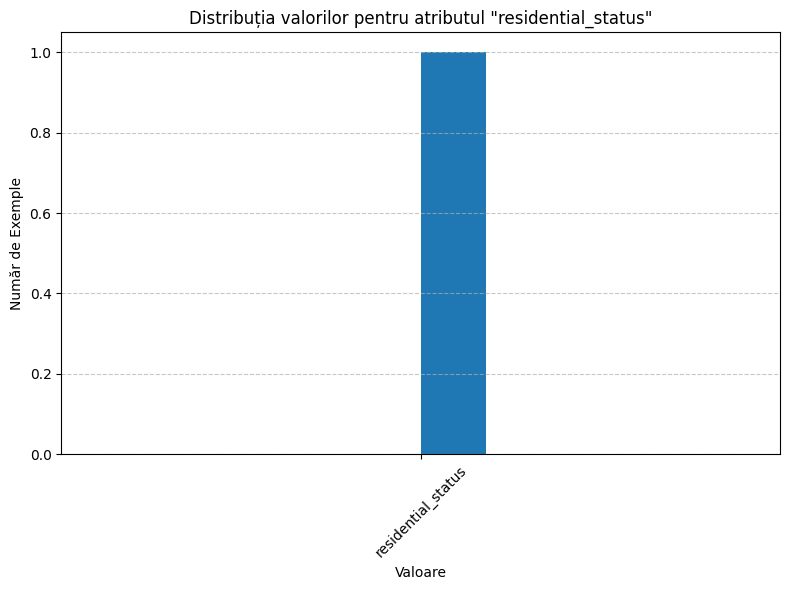

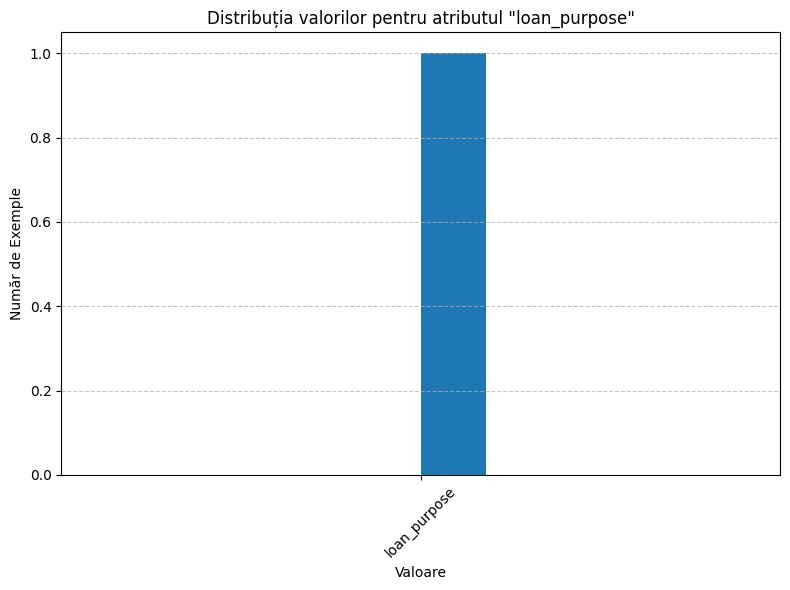

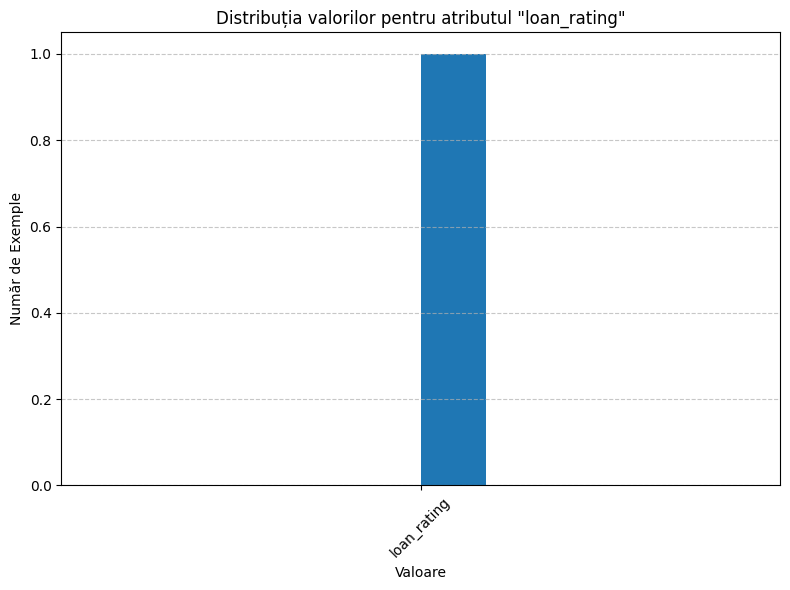

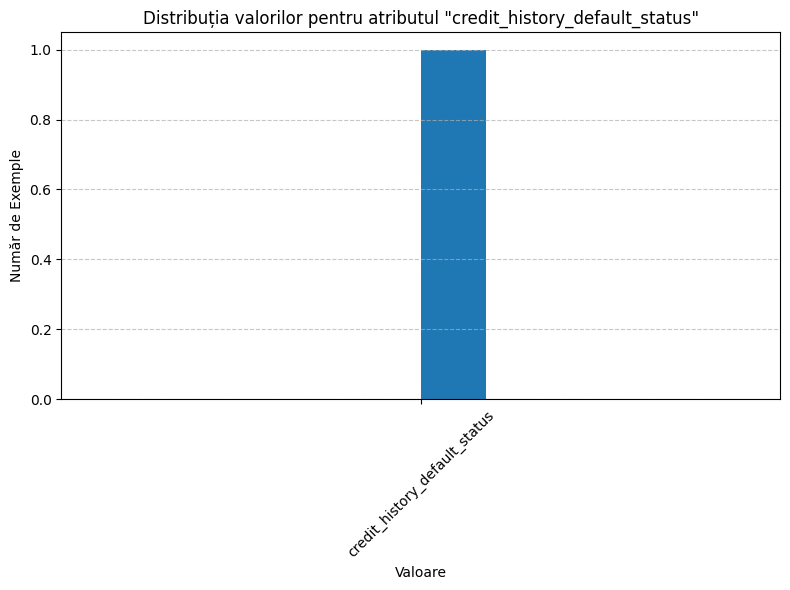

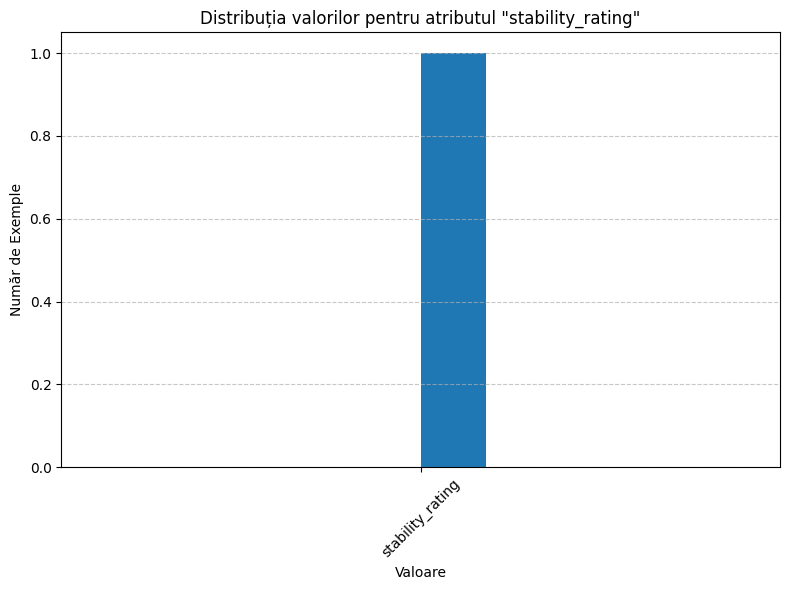

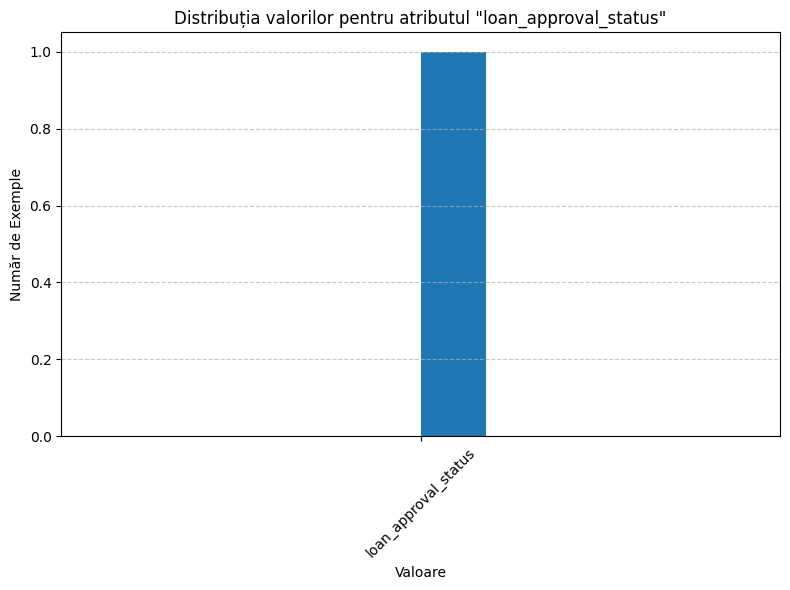

In [20]:
#train
for attribute in categorical_attributes.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(attribute, bins=10)
    plt.title(f'Distribuția valorilor pentru atributul "{attribute}"')
    plt.xlabel('Valoare')
    plt.ylabel('Număr de Exemple')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

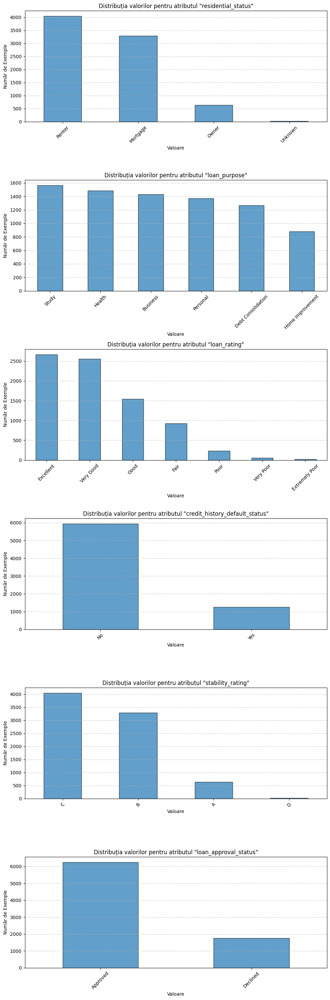

In [21]:
#train
num_attributes = len(categorical_attributes.columns)
fig, axes = plt.subplots(nrows=num_attributes, ncols=1, figsize=(10, 5 * num_attributes))
for i, attribute in enumerate(categorical_attributes.columns):
    df_train[attribute].value_counts().plot(kind='bar', ax=axes[i], edgecolor='k', alpha=0.7)
    axes[i].set_title(f'Distribuția valorilor pentru atributul "{attribute}"')
    axes[i].set_xlabel('Valoare')
    axes[i].set_ylabel('Număr de Exemple')
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

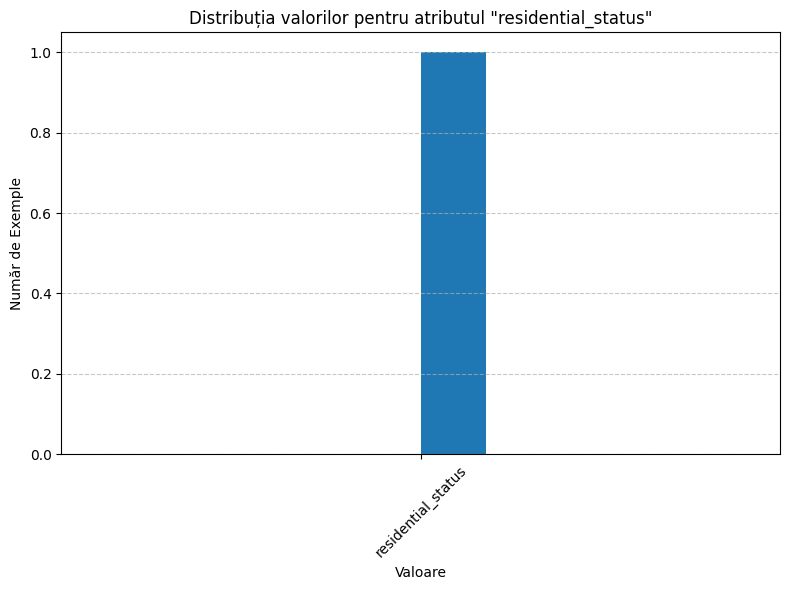

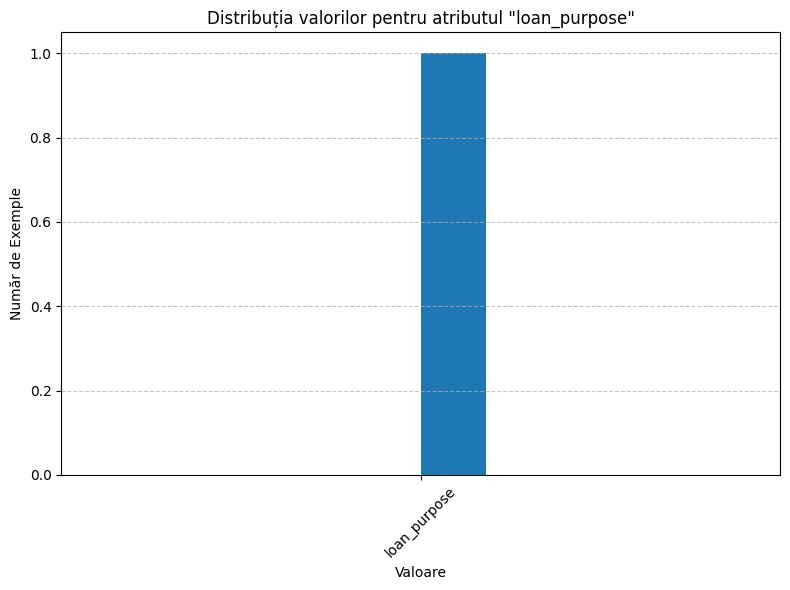

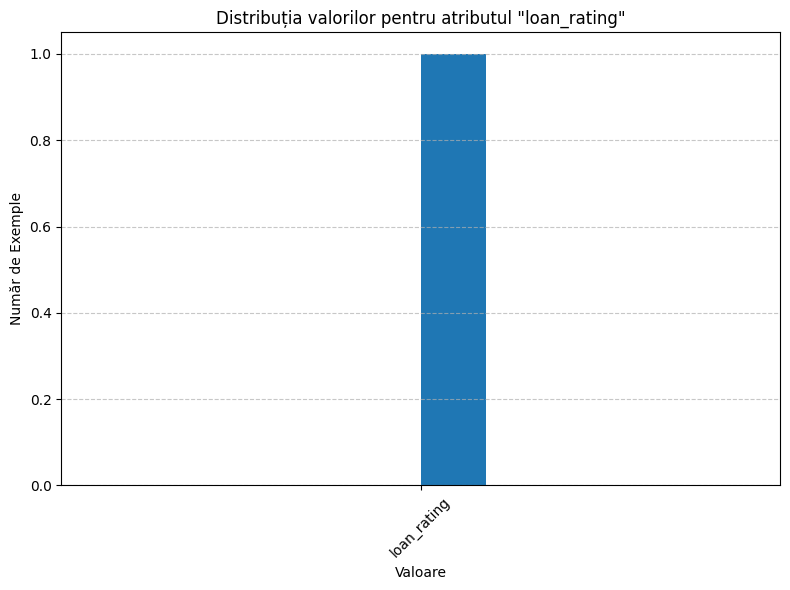

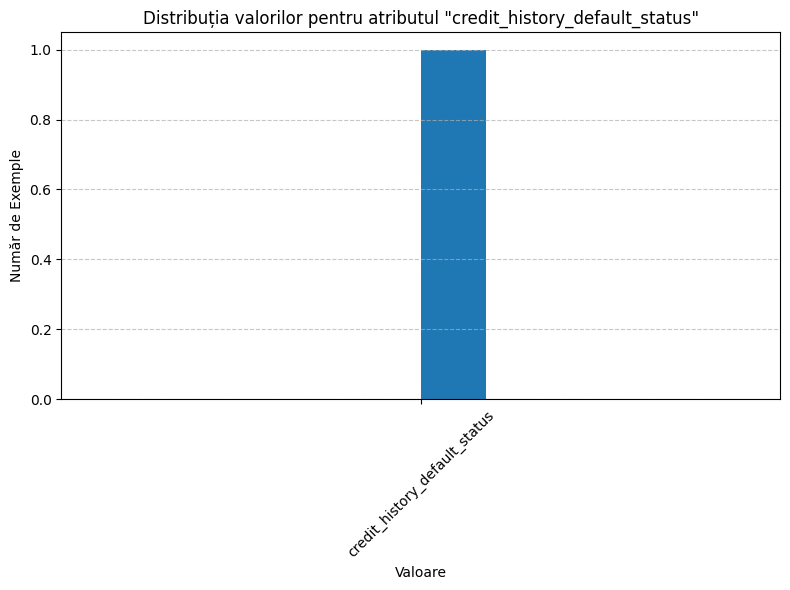

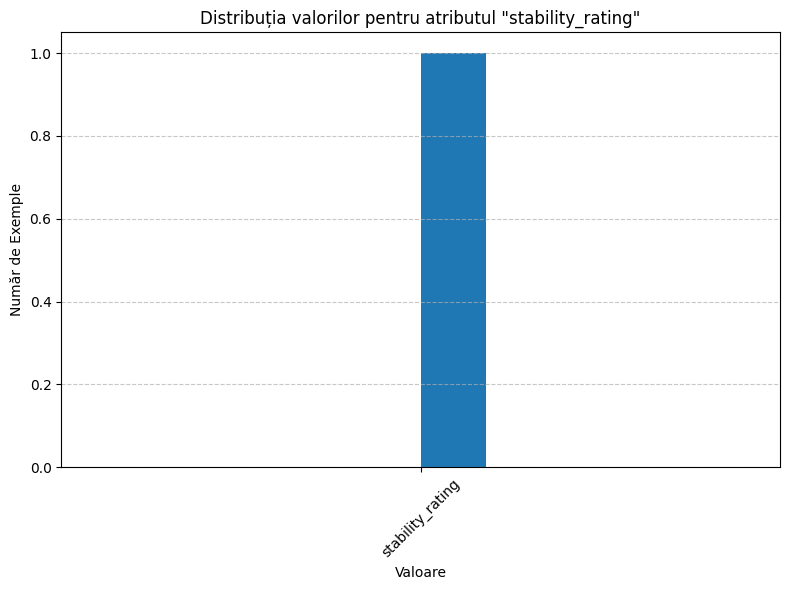

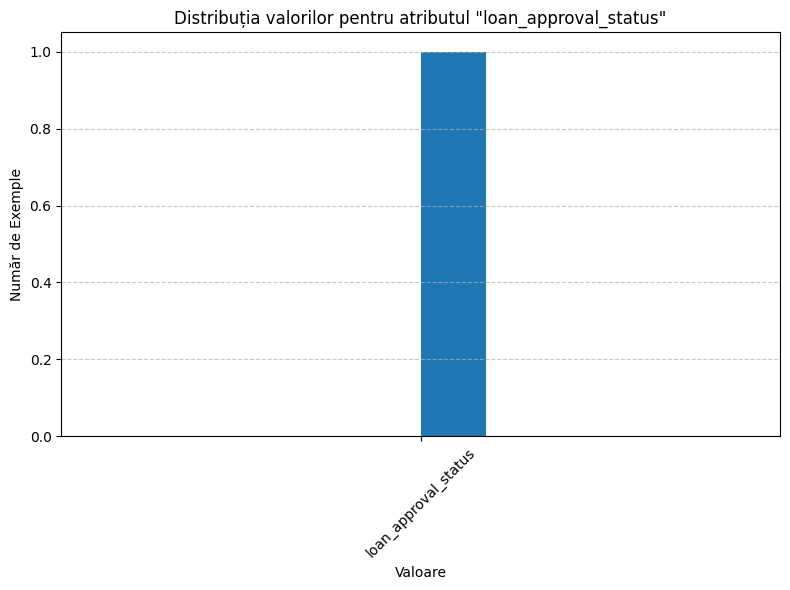

In [22]:
#test
for attribute in categorical_attributes_test.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(attribute, bins=10)
    plt.title(f'Distribuția valorilor pentru atributul "{attribute}"')
    plt.xlabel('Valoare')
    plt.ylabel('Număr de Exemple')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

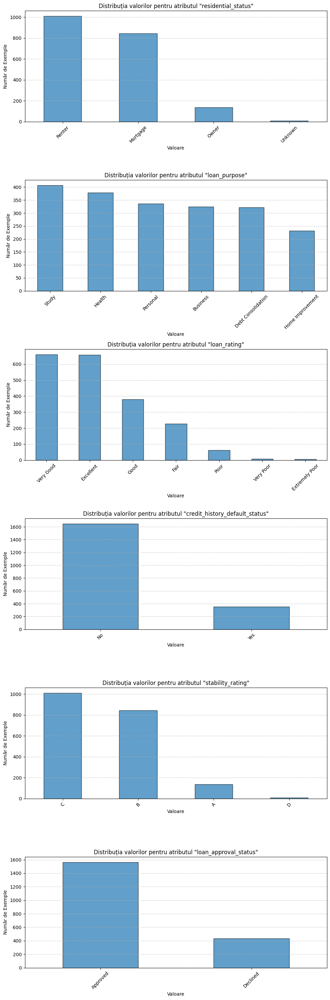

In [23]:
#test
num_attributes = len(categorical_attributes_test.columns)
fig, axes = plt.subplots(nrows=num_attributes, ncols=1, figsize=(10, 5 * num_attributes))
for i, attribute in enumerate(categorical_attributes_test.columns):
    df_test[attribute].value_counts().plot(kind='bar', ax=axes[i], edgecolor='k', alpha=0.7)
    axes[i].set_title(f'Distribuția valorilor pentru atributul "{attribute}"')
    axes[i].set_xlabel('Valoare')
    axes[i].set_ylabel('Număr de Exemple')
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Grafice histografice pentru train si test pentru Salary_Prediction

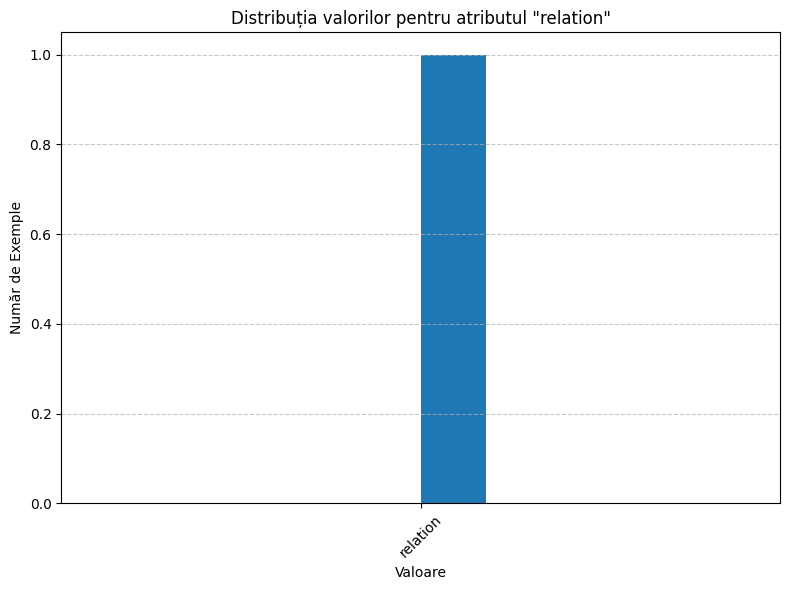

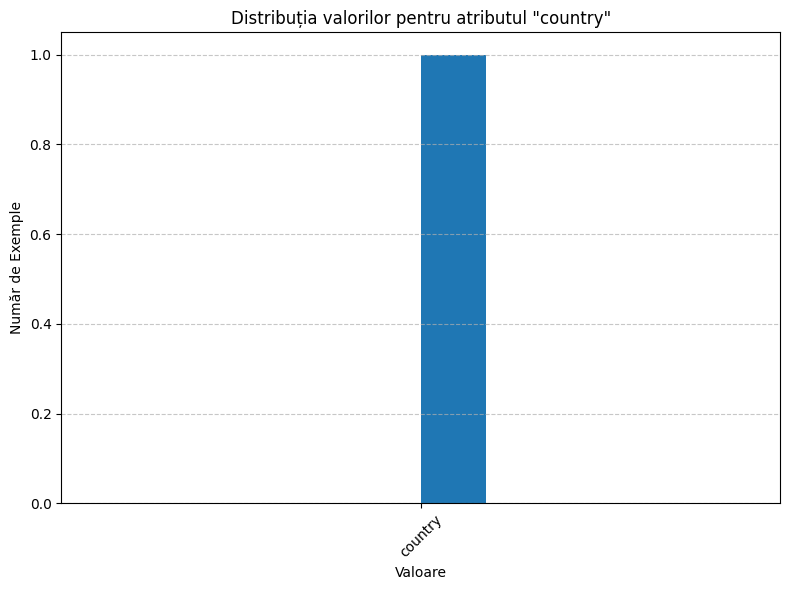

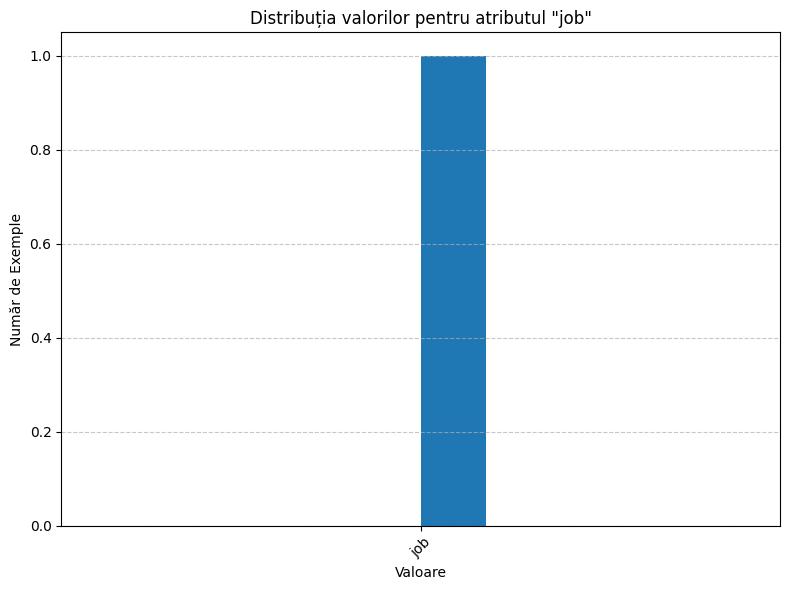

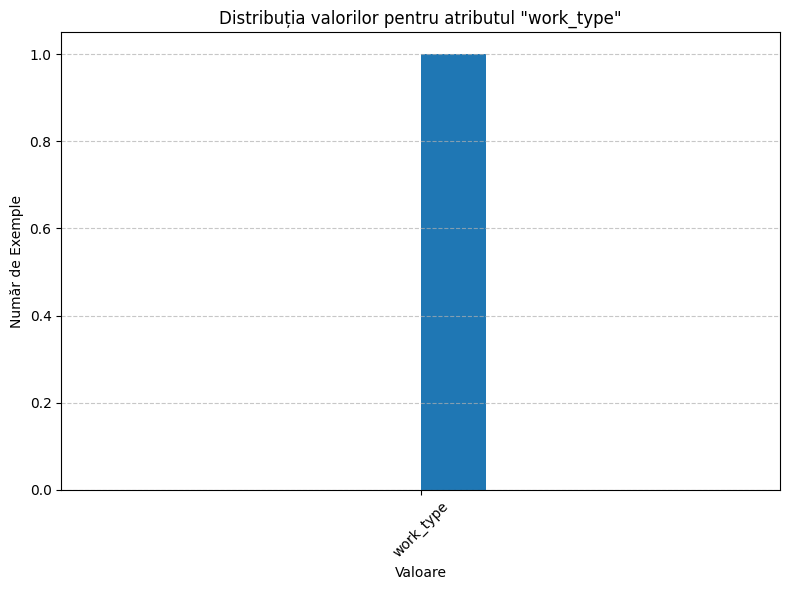

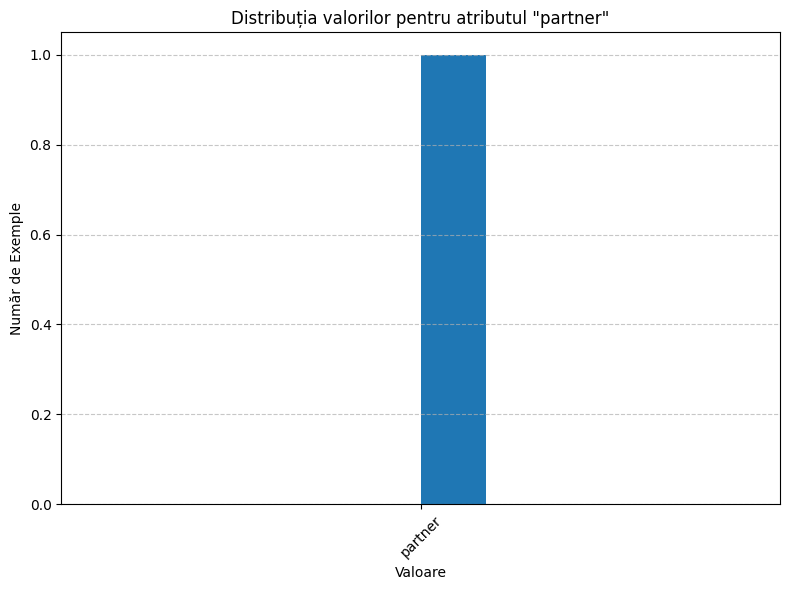

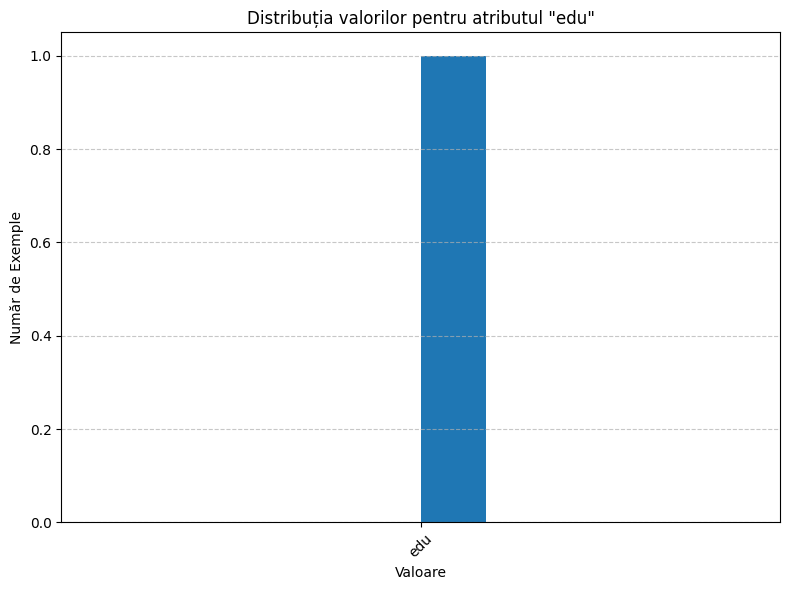

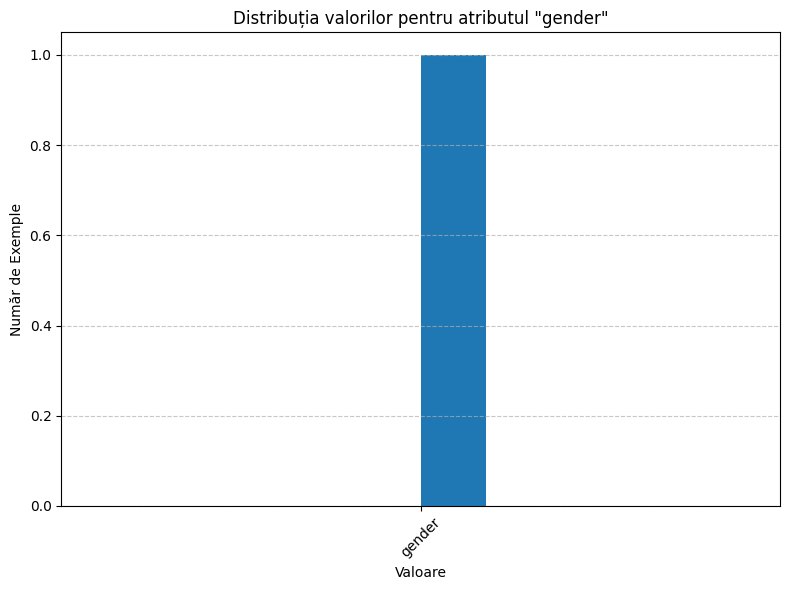

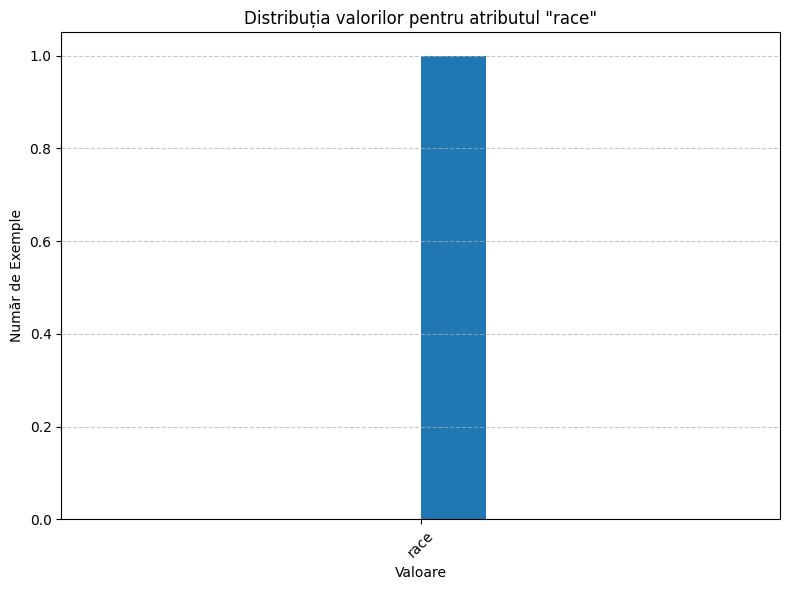

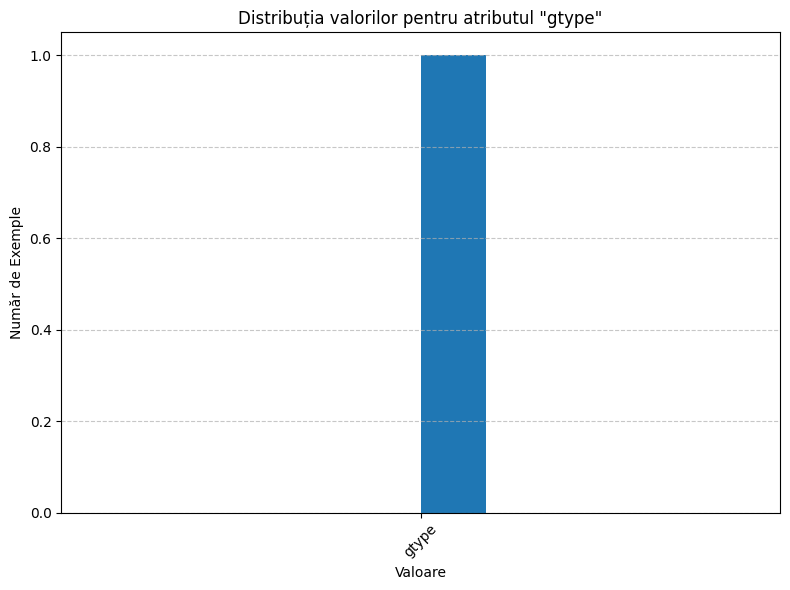

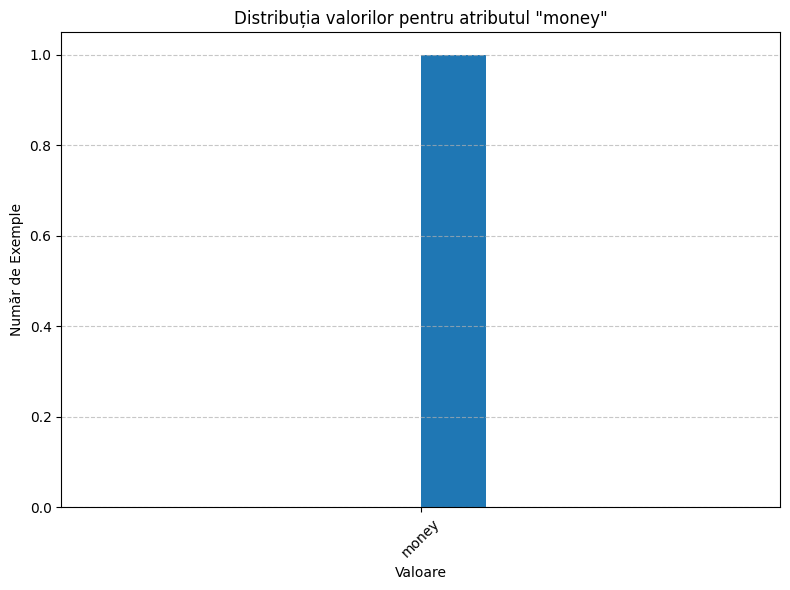

In [24]:
#train
for attribute in categorical_attributes_s.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(attribute, bins=10)
    plt.title(f'Distribuția valorilor pentru atributul "{attribute}"')
    plt.xlabel('Valoare')
    plt.ylabel('Număr de Exemple')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

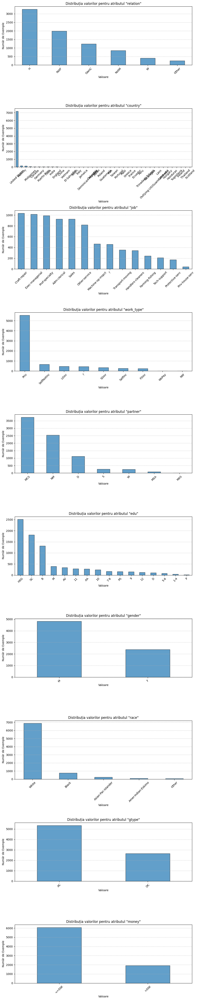

In [25]:
#train
num_attributes = len(categorical_attributes_s.columns)
fig, axes = plt.subplots(nrows=num_attributes, ncols=1, figsize=(10, 5 * num_attributes))
for i, attribute in enumerate(categorical_attributes_s.columns):
    df_train_s[attribute].value_counts().plot(kind='bar', ax=axes[i], edgecolor='k', alpha=0.7)
    axes[i].set_title(f'Distribuția valorilor pentru atributul "{attribute}"')
    axes[i].set_xlabel('Valoare')
    axes[i].set_ylabel('Număr de Exemple')
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

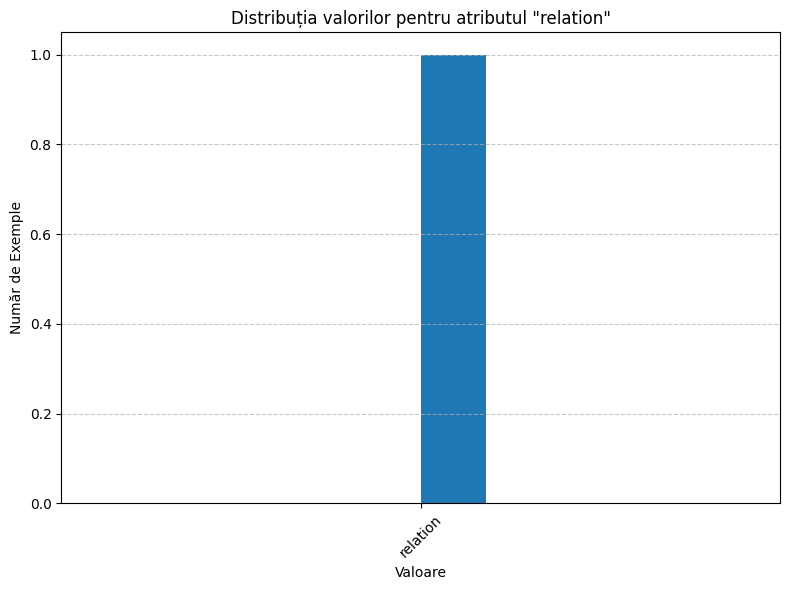

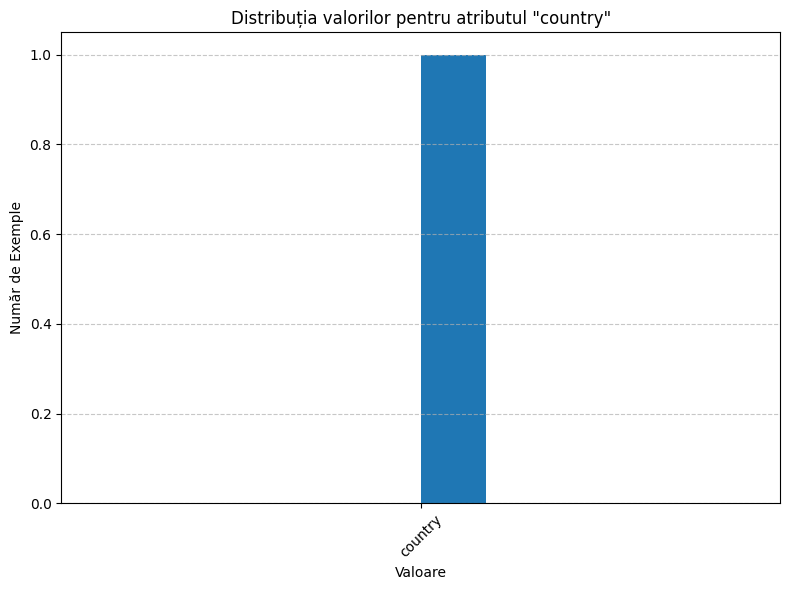

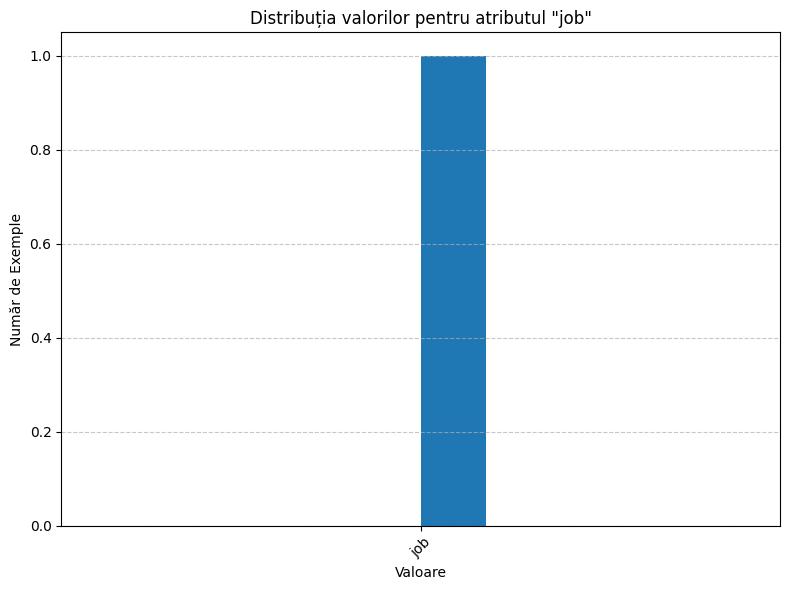

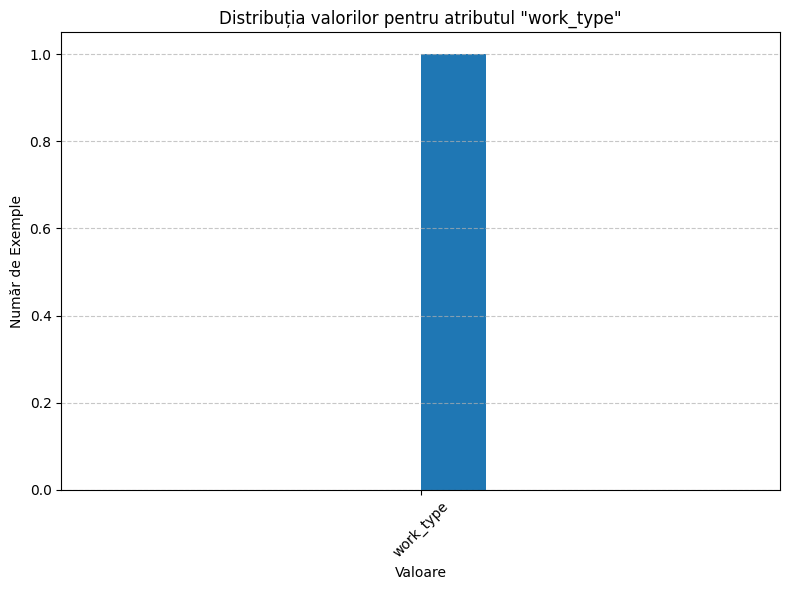

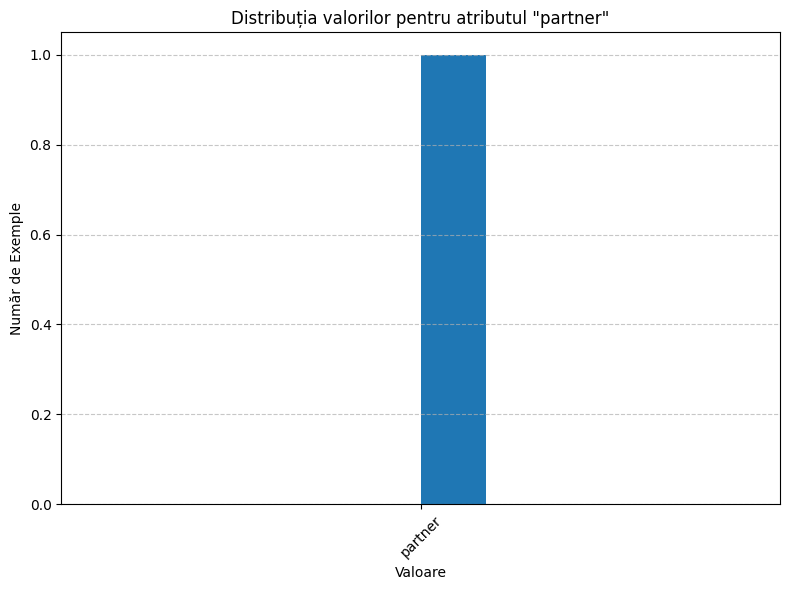

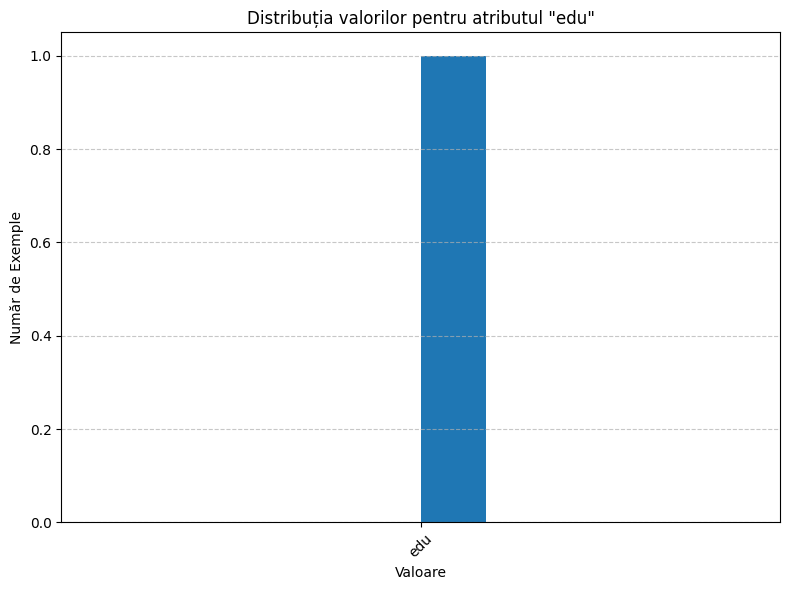

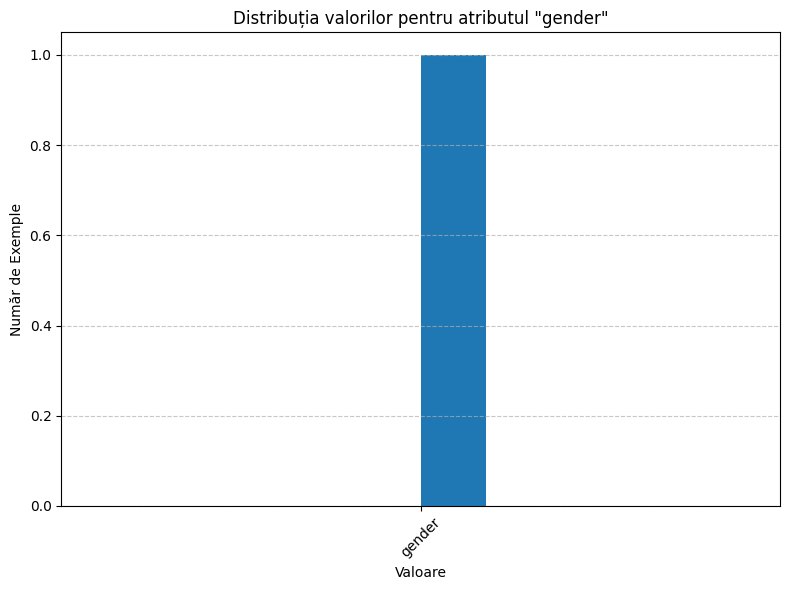

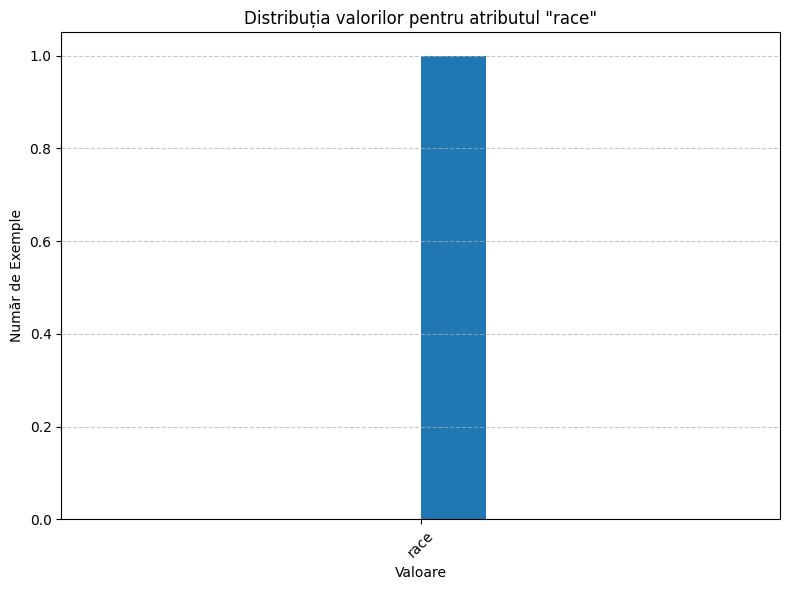

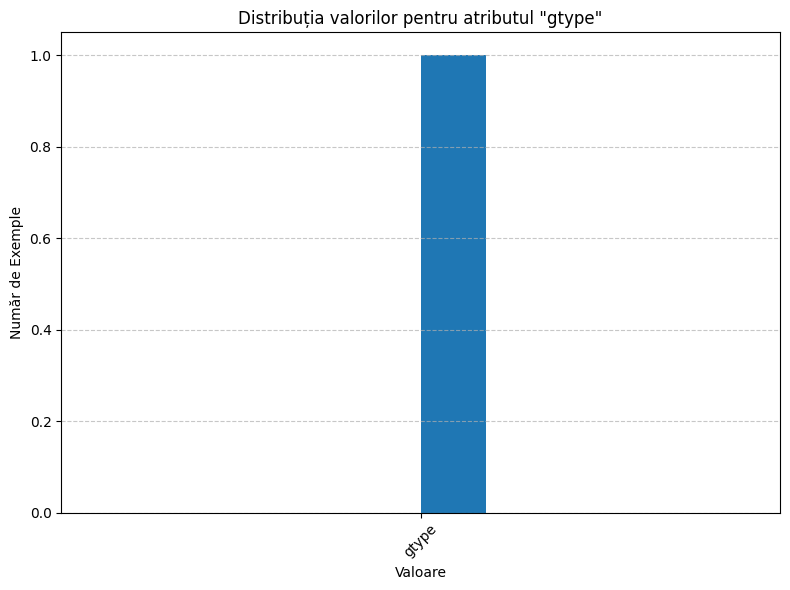

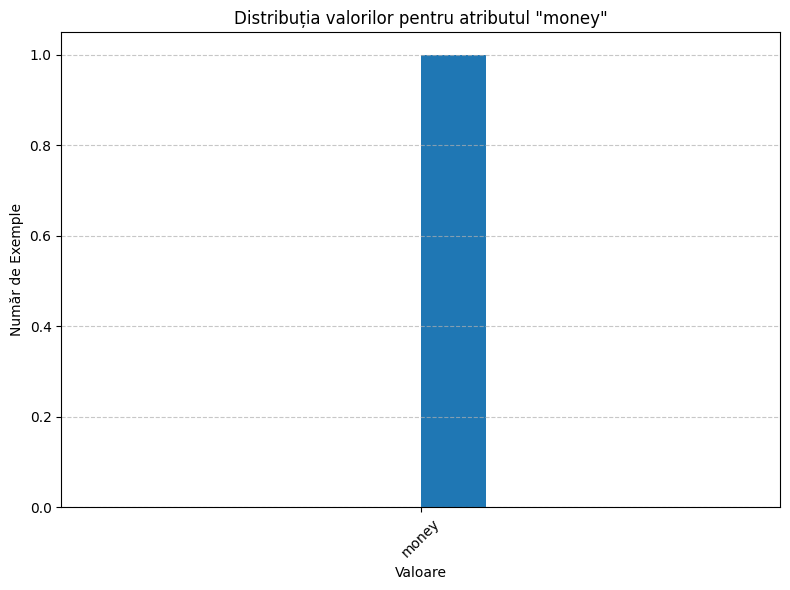

In [26]:
#test
for attribute in categorical_attributes_test_s.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(attribute, bins=10)
    plt.title(f'Distribuția valorilor pentru atributul "{attribute}"')
    plt.xlabel('Valoare')
    plt.ylabel('Număr de Exemple')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

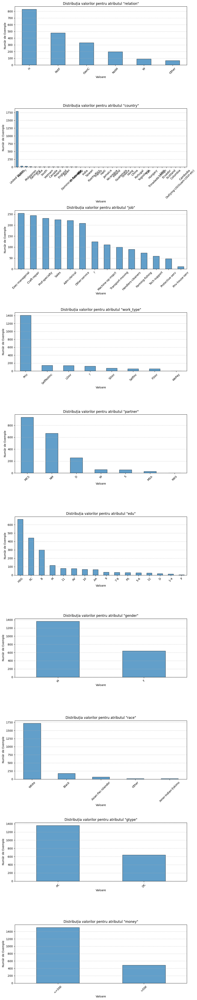

In [27]:
#test
num_attributes = len(categorical_attributes_test_s.columns)
fig, axes = plt.subplots(nrows=num_attributes, ncols=1, figsize=(10, 5 * num_attributes))
for i, attribute in enumerate(categorical_attributes_test_s.columns):
    df_test_s[attribute].value_counts().plot(kind='bar', ax=axes[i], edgecolor='k', alpha=0.7)
    axes[i].set_title(f'Distribuția valorilor pentru atributul "{attribute}"')
    axes[i].set_xlabel('Valoare')
    axes[i].set_ylabel('Număr de Exemple')
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Analiza echilibrului de clasa atat pentru train cat si pentru test pentru Credit_Risk

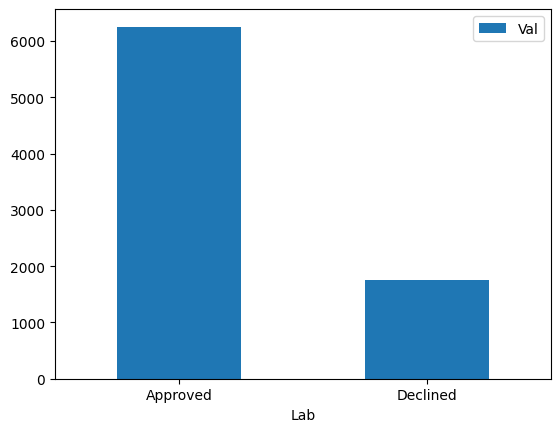

In [28]:
Approved_number = df_train['loan_approval_status'].value_counts()['Approved']
Declined_number = df_train['loan_approval_status'].value_counts()['Declined']

statistic = pd.DataFrame({'Lab' : ['Approved', 'Declined'], 'Val' : [Approved_number, Declined_number]})
statistic_bar = statistic.plot.bar(x='Lab', y='Val', rot=0)

plt.show()

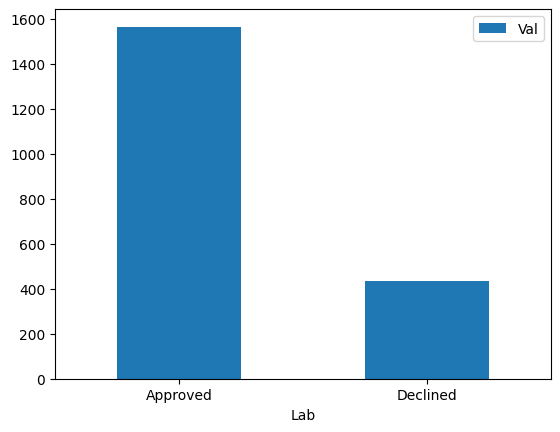

In [29]:
Approved_number_test = df_test['loan_approval_status'].value_counts()['Approved']
Declined_number_test = df_test['loan_approval_status'].value_counts()['Declined']

statistic = pd.DataFrame({'Lab' : ['Approved', 'Declined'], 'Val' : [Approved_number_test, Declined_number_test]})
statistic_bar = statistic.plot.bar(x='Lab', y='Val', rot=0)

plt.savefig('class balance study for test')
plt.show()

Analiza echilibrului de clasa atat pentru train cat si pentru test pentru Salary_Prediction

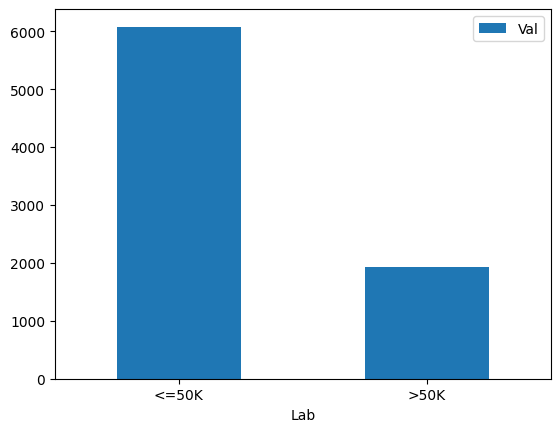

In [30]:
Approved_number = df_train_s['money'].value_counts()['<=50K']
Declined_number = df_train_s['money'].value_counts()['>50K']

statistic = pd.DataFrame({'Lab' : ['<=50K', '>50K'], 'Val' : [Approved_number, Declined_number]})
statistic_bar = statistic.plot.bar(x='Lab', y='Val', rot=0)

plt.show()

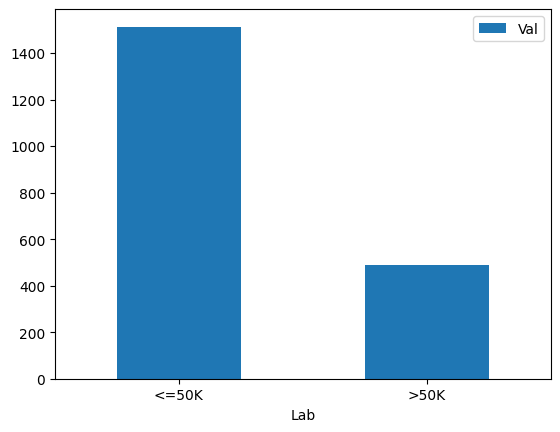

In [31]:
Approved_number = df_test_s['money'].value_counts()['<=50K']
Declined_number = df_test_s['money'].value_counts()['>50K']

statistic = pd.DataFrame({'Lab' : ['<=50K', '>50K'], 'Val' : [Approved_number, Declined_number]})
statistic_bar = statistic.plot.bar(x='Lab', y='Val', rot=0)

plt.show()

studiul corelatiei pentru Credit_Risk

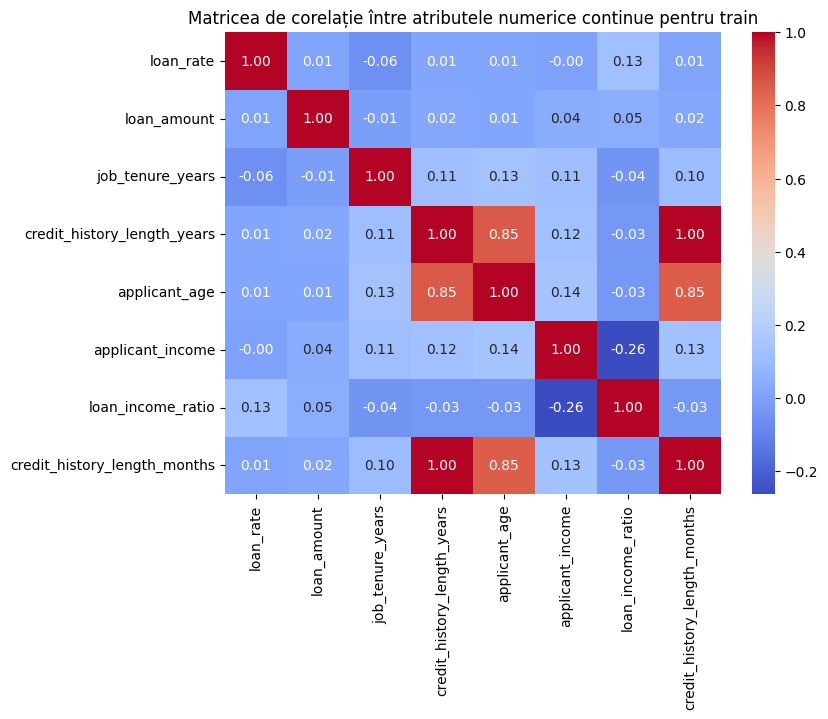

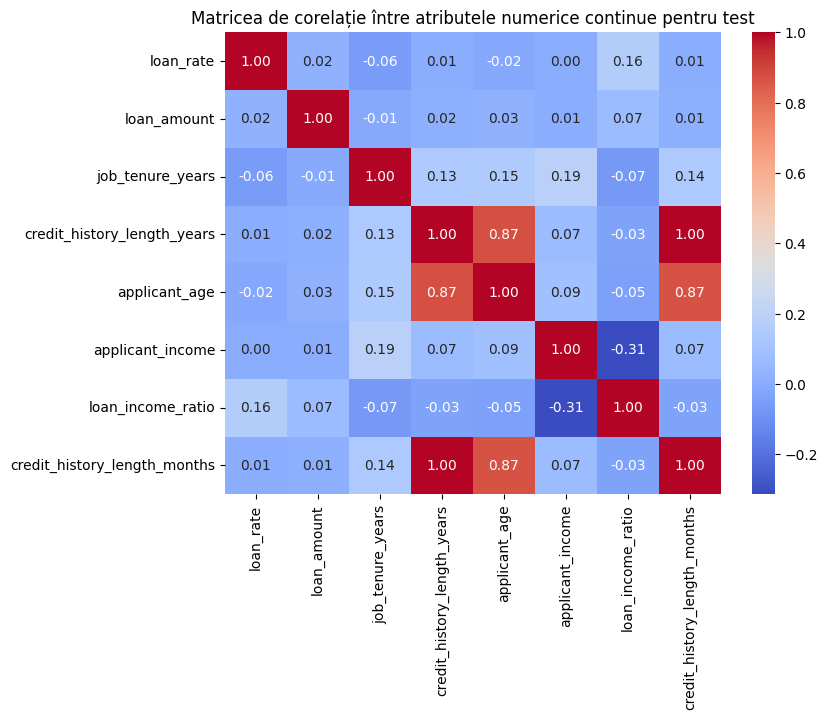

In [32]:
correlation_matrix_numerical = numeric_attributes.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue pentru train')
plt.show()

correlation_matrix_numerical_test = numeric_attributes_test.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical_test, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue pentru test')
plt.show()

Studiul corelatiei pentru Salary_Prediction

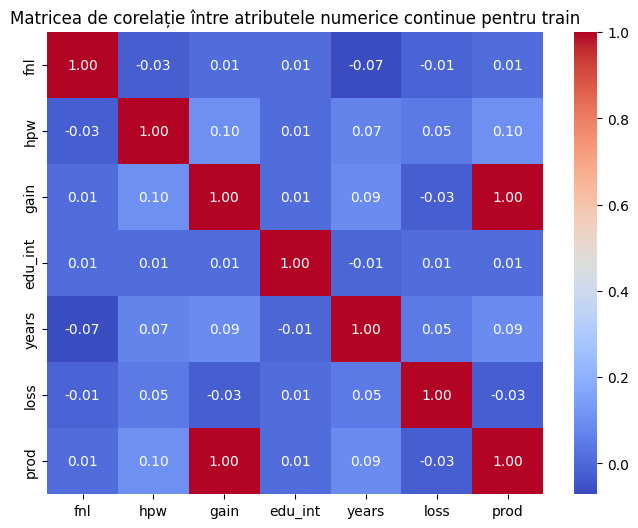

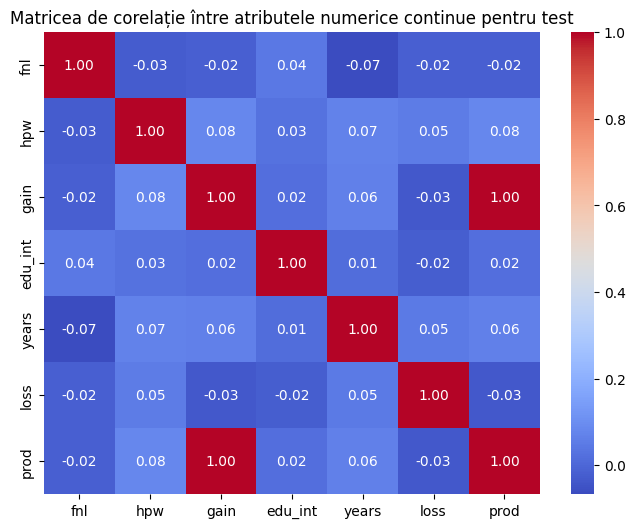

In [33]:
correlation_matrix_numerical_s = numeric_attributes_s.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical_s, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue pentru train')
plt.show()

correlation_matrix_numerical_test_s = numeric_attributes_test_s.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical_test_s, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue pentru test')
plt.show()

implemetarea modulului chi2 pentru atributele categorice atat pentru train cat si pentru test pentru Credit_Risk

In [34]:
chi2_results = []

for col1 in categorical_attributes.columns:
    for col2 in categorical_attributes.columns:
        if col1 != col2:
            contingency_table = pd.crosstab(categorical_attributes[col1], categorical_attributes[col2])
            chi2, p, _, _ = stats.chi2_contingency(contingency_table)
            chi2_results.append({'Attribute1': col1, 'Attribute2': col2, 'Chi2': chi2, 'p-value': p})
chi2_df = pd.DataFrame(chi2_results)

print("chi2_df train --------------- ")
print(chi2_df.to_string())

chi2_results_test = []

for col1 in categorical_attributes_test.columns:
    for col2 in categorical_attributes_test.columns:
        if col1 != col2:
            contingency_table_test = pd.crosstab(categorical_attributes_test[col1], categorical_attributes_test[col2])
            chi2, p, _, _ = stats.chi2_contingency(contingency_table_test)
            chi2_results_test.append({'Attribute1': col1, 'Attribute2': col2, 'Chi2': chi2, 'p-value': p})
chi2_df_test = pd.DataFrame(chi2_results_test)
print()
print("chis2_df test ----------------")
print(chi2_df_test.to_string())

chi2_df train --------------- 
                       Attribute1                     Attribute2          Chi2        p-value
0              residential_status                   loan_purpose    179.612245   2.846328e-30
1              residential_status                    loan_rating    187.223094   3.535668e-30
2              residential_status  credit_history_default_status      9.426057   2.413114e-02
3              residential_status               stability_rating  24000.000000   0.000000e+00
4              residential_status           loan_approval_status    476.391078  6.234799e-103
5                    loan_purpose             residential_status    179.612245   2.846328e-30
6                    loan_purpose                    loan_rating     25.648945   6.929226e-01
7                    loan_purpose  credit_history_default_status      9.520056   9.003406e-02
8                    loan_purpose               stability_rating    179.612245   2.846328e-30
9                    loan_pur

implemetarea modulului chi2 pentru atributele categorice atat pentru train cat si pentru test pentru Salary_Prediction

In [35]:
chi2_results_s = []

for col1 in categorical_attributes_s.columns:
    for col2 in categorical_attributes_s.columns:
        if col1 != col2:
            contingency_table = pd.crosstab(categorical_attributes_s[col1], categorical_attributes_s[col2])
            chi2, p, _, _ = stats.chi2_contingency(contingency_table)
            chi2_results_s.append({'Attribute1': col1, 'Attribute2': col2, 'Chi2': chi2, 'p-value': p})
chi2_df_s = pd.DataFrame(chi2_results_s)

print("chi2_df_s train --------------- ")
print(chi2_df_s.to_string())

chi2_results_test_s = []

for col1 in categorical_attributes_test_s.columns:
    for col2 in categorical_attributes_test_s.columns:
        if col1 != col2:
            contingency_table_test = pd.crosstab(categorical_attributes_test_s[col1], categorical_attributes_test_s[col2])
            chi2, p, _, _ = stats.chi2_contingency(contingency_table_test)
            chi2_results_test_s.append({'Attribute1': col1, 'Attribute2': col2, 'Chi2': chi2, 'p-value': p})
chi2_df_test_s = pd.DataFrame(chi2_results_test_s)
print()
print("chis2_df test ----------------")
print(chi2_df_test_s.to_string())

chi2_df_s train --------------- 
   Attribute1 Attribute2          Chi2        p-value
0    relation    country    530.437886   7.952709e-33
1    relation        job   1368.873378  2.633000e-243
2    relation  work_type    484.998059   8.783667e-78
3    relation    partner   9466.978962   0.000000e+00
4    relation        edu    690.406956  2.600025e-100
5    relation     gender   3080.743186   0.000000e+00
6    relation       race    382.453709   8.835463e-69
7    relation      gtype   3388.096350   0.000000e+00
8    relation      money   1592.508855   0.000000e+00
9     country   relation    530.437886   7.952709e-33
10    country        job    996.809144   3.006992e-34
11    country  work_type    282.124770   8.867671e-01
12    country    partner    454.555713   2.696167e-16
13    country        edu   2863.198741  6.429982e-296
14    country     gender     60.552435   1.145230e-02
15    country       race   5880.710962   0.000000e+00
16    country      gtype     66.307288   4.113311

Simple Imputer pentru train si pentru test pentru Credit_Risk

In [36]:
#train

imputer = SimpleImputer(strategy='mean') # selectam sa faca media
numeric_attributes_imputed = pd.DataFrame(imputer.fit_transform(numeric_attributes), columns=numeric_attributes.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_train[numeric_attributes.columns] = numeric_attributes_imputed

imputer_categoric = SimpleImputer(strategy='most_frequent') # most-frequent este folosint atat pentru valori numerice cat si pentru string-uri, in cazul nostru pentru string-uri
categoric_attributes_imputed = pd.DataFrame(imputer_categoric.fit_transform(categorical_attributes), columns=categorical_attributes.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_train[categorical_attributes.columns] = categoric_attributes_imputed

print("results : ", df_train.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   residential_status             8000 non-null   object 
 1   loan_rate                      8000 non-null   float64
 2   loan_amount                    8000 non-null   float64
 3   loan_purpose                   8000 non-null   object 
 4   job_tenure_years               8000 non-null   float64
 5   credit_history_length_years    8000 non-null   float64
 6   applicant_age                  8000 non-null   float64
 7   applicant_income               8000 non-null   float64
 8   loan_rating                    8000 non-null   object 
 9   credit_history_default_status  8000 non-null   object 
 10  loan_income_ratio              8000 non-null   float64
 11  stability_rating               8000 non-null   object 
 12  credit_history_length_months   8000 non-null   f

In [37]:
# test

imputer_test = SimpleImputer(strategy='mean')
numeric_attributes_test_imputed = pd.DataFrame(imputer_test.fit_transform(numeric_attributes_test), columns=numeric_attributes_test.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_test[numeric_attributes_test.columns] = numeric_attributes_test_imputed

imputer_categoric_test = SimpleImputer(strategy='most_frequent')
categoric_attributes_test_imputed = pd.DataFrame(imputer_categoric_test.fit_transform(categorical_attributes_test), columns=categorical_attributes_test.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_test[categorical_attributes_test.columns] = categoric_attributes_test_imputed

print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   residential_status             2000 non-null   object 
 1   loan_rate                      2000 non-null   float64
 2   loan_amount                    2000 non-null   float64
 3   loan_purpose                   2000 non-null   object 
 4   job_tenure_years               2000 non-null   float64
 5   credit_history_length_years    2000 non-null   float64
 6   applicant_age                  2000 non-null   float64
 7   applicant_income               2000 non-null   float64
 8   loan_rating                    2000 non-null   object 
 9   credit_history_default_status  2000 non-null   object 
 10  loan_income_ratio              2000 non-null   float64
 11  stability_rating               2000 non-null   object 
 12  credit_history_length_months   2000 non-null   f

Simple Imputer pentru train si pentru test pentru Salary_Prediction

In [38]:
#train

imputer_s = SimpleImputer(strategy='mean') # selectam sa faca media
numeric_attributes_s_imputed = pd.DataFrame(imputer_s.fit_transform(numeric_attributes_s), columns=numeric_attributes_s.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_train_s[numeric_attributes_s.columns] = numeric_attributes_s_imputed

imputer_categoric_s = SimpleImputer(strategy='most_frequent') # most-frequent este folosint atat pentru valori numerice cat si pentru string-uri, in cazul nostru pentru string-uri
categoric_attributes_s_imputed = pd.DataFrame(imputer_categoric_s.fit_transform(categorical_attributes_s), columns=categorical_attributes_s.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_train_s[categorical_attributes_s.columns] = categoric_attributes_s_imputed

print("results : ", df_train_s.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   fnl        7999 non-null   float64
 1   hpw        7999 non-null   float64
 2   relation   7999 non-null   object 
 3   gain       7999 non-null   float64
 4   country    7999 non-null   object 
 5   job        7999 non-null   object 
 6   edu_int    7999 non-null   float64
 7   years      7999 non-null   float64
 8   loss       7999 non-null   float64
 9   work_type  7999 non-null   object 
 10  partner    7999 non-null   object 
 11  edu        7999 non-null   object 
 12  gender     7999 non-null   object 
 13  race       7999 non-null   object 
 14  prod       7999 non-null   float64
 15  gtype      7999 non-null   object 
 16  money      7999 non-null   object 
dtypes: float64(7), object(10)
memory usage: 1.0+ MB
results :  None


In [39]:
#test

imputer_test_s = SimpleImputer(strategy='mean') # selectam sa faca media
numeric_attributes_test_s_imputed = pd.DataFrame(imputer_test_s.fit_transform(numeric_attributes_test_s), columns=numeric_attributes_test_s.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_test_s[numeric_attributes_test_s.columns] = numeric_attributes_test_s_imputed

imputer_categoric_test_s = SimpleImputer(strategy='most_frequent') # most-frequent este folosint atat pentru valori numerice cat si pentru string-uri, in cazul nostru pentru string-uri
categoric_attributes_test_s_imputed = pd.DataFrame(imputer_categoric_test_s.fit_transform(categorical_attributes_test_s), columns=categorical_attributes_test_s.columns) # umplem valorile lipsa cu media valorilor de pe coloana
df_test_s[categorical_attributes_test_s.columns] = categoric_attributes_test_s_imputed

print("results : ", df_test_s.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   fnl        2000 non-null   float64
 1   hpw        2000 non-null   float64
 2   relation   2000 non-null   object 
 3   gain       2000 non-null   float64
 4   country    2000 non-null   object 
 5   job        2000 non-null   object 
 6   edu_int    2000 non-null   float64
 7   years      2000 non-null   float64
 8   loss       2000 non-null   float64
 9   work_type  2000 non-null   object 
 10  partner    2000 non-null   object 
 11  edu        2000 non-null   object 
 12  gender     2000 non-null   object 
 13  race       2000 non-null   object 
 14  prod       2000 non-null   float64
 15  gtype      2000 non-null   object 
 16  money      2000 non-null   object 
dtypes: float64(7), object(10)
memory usage: 265.8+ KB
results :  None


Valori extreme dintr-un esantion pentru train si pentru test pentru Credit_Risk

In [40]:
# train

Q1 = numeric_statistics.loc['25%']
Q3 = numeric_statistics.loc['75%']
IQR = Q3 - Q1

lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

extreme_values = (numeric_attributes < lower_threshold) | (numeric_attributes > upper_threshold)

for column in numeric_attributes.columns:
    column_extreme_values = extreme_values[column]
    column_values = numeric_attributes[column].loc[column_extreme_values]
    column_values = column_values.values.reshape(-1, 1)
    imputed_values = imputer.fit_transform(column_values)
    numeric_attributes.loc[column_extreme_values, column] = imputed_values.flatten()

df_train.update(numeric_attributes)

print(df_train.describe())


         loan_rate   loan_amount  job_tenure_years  \
count  8000.000000  8.000000e+03       8000.000000   
mean     11.011079  3.887819e+07          4.729001   
std       3.118284  2.845087e+08          4.146917   
min       5.420000  5.000000e+02          0.000000   
25%       8.070000  5.000000e+03          2.000000   
50%      11.011079  8.000000e+03          4.000000   
75%      13.160000  1.350000e+04          7.000000   
max      22.110000  5.695115e+09        123.000000   

       credit_history_length_years  applicant_age  applicant_income  \
count                  8000.000000    8000.000000      8.000000e+03   
mean                      5.857500      27.789125      6.566213e+04   
std                       4.096497       6.464200      5.883553e+04   
min                       2.000000      20.000000      4.200000e+03   
25%                       3.000000      23.000000      3.840000e+04   
50%                       4.000000      26.000000      5.500000e+04   
75%             

In [41]:
# test

Q1_test = numeric_statistics_test.loc['25%']
Q3_test = numeric_statistics_test.loc['75%']
IQR_test = Q3_test - Q1_test

lower_threshold_test = Q1_test - 1.5 * IQR_test
upper_threshold_test = Q3_test + 1.5 * IQR_test

extreme_values_test = (numeric_attributes_test < lower_threshold_test) | (numeric_attributes_test > upper_threshold_test)


for column in numeric_attributes_test.columns:
    column_extreme_values_test = extreme_values_test[column]
    column_values_test = numeric_attributes_test[column].loc[column_extreme_values_test]
    column_values_test = column_values_test.values.reshape(-1, 1)
    imputed_values_test = imputer_test.fit_transform(column_values_test)
    numeric_attributes_test.loc[column_extreme_values_test, column] = imputed_values_test.flatten()

df_test.update(numeric_attributes_test)

print(df_test.describe())

         loan_rate   loan_amount  job_tenure_years  \
count  2000.000000  2.000000e+03       2000.000000   
mean     10.991481  3.660534e+07          5.012308   
std       3.072659  2.637011e+08          4.838136   
min       5.420000  5.000000e+02          0.000000   
25%       8.320000  5.000000e+03          2.000000   
50%      10.991481  8.000000e+03          4.000000   
75%      13.110000  1.320000e+04          7.000000   
max      23.220000  4.346934e+09        123.000000   

       credit_history_length_years  applicant_age  applicant_income  \
count                  2000.000000    2000.000000       2000.000000   
mean                      5.625500      27.569000      66022.531000   
std                       3.854955       5.924001      48662.377321   
min                       2.000000      20.000000       8088.000000   
25%                       3.000000      23.000000      39540.000000   
50%                       4.000000      26.000000      56000.000000   
75%             

Valori extreme dintr-un esantion pentru train si pentru test pentru Salary_Prediction

In [42]:
# train

Q1_s = numeric_statistics_s.loc['25%']
Q3_s = numeric_statistics_s.loc['75%']
IQR_s = Q3_s - Q1_s

lower_threshold_s = Q1_s - 1.5 * IQR_s
upper_threshold_s = Q3_s + 1.5 * IQR_s

extreme_values_s = (numeric_attributes_s < lower_threshold_s) | (numeric_attributes_s > upper_threshold_s)

for column in numeric_attributes_s.columns:
    column_extreme_values = extreme_values_s[column]
    column_values = numeric_attributes_s[column].loc[column_extreme_values]
    column_values = column_values.values.reshape(-1, 1)
    imputed_values = imputer_s.fit_transform(column_values)
    numeric_attributes_s.loc[column_extreme_values, column] = imputed_values.flatten()

df_train_s.update(numeric_attributes_s)

print(df_train_s.describe())


                fnl          hpw          gain      edu_int        years  \
count  7.999000e+03  7999.000000   7999.000000  7999.000000  7999.000000   
mean   1.904565e+05    40.307404   1005.272659    13.975247    38.722465   
std    1.064185e+05    11.876588   7164.778566    23.867180    13.708618   
min    1.921400e+04     1.000000      0.000000     1.000000    17.000000   
25%    1.182210e+05    40.000000      0.000000     9.000000    28.000000   
50%    1.783530e+05    40.000000      0.000000    10.000000    37.000000   
75%    2.380305e+05    45.000000      0.000000    13.000000    48.000000   
max    1.455435e+06    99.000000  99999.000000   205.000000    90.000000   

              loss           prod  
count  7999.000000    7999.000000  
mean     77.485436    2065.810101  
std     378.352748   14329.484489  
min       0.000000     -28.000000  
25%       0.000000      42.000000  
50%       0.000000      57.000000  
75%       0.000000      77.000000  
max    3770.000000  200110.

In [43]:
# test

Q1_test_s = numeric_statistics_test_s.loc['25%']
Q3_test_s = numeric_statistics_test_s.loc['75%']
IQR_test_s = Q3_test_s - Q1_test_s

lower_threshold_test_s = Q1_test_s - 1.5 * IQR_test_s
upper_threshold_test_s = Q3_test_s + 1.5 * IQR_test_s

extreme_values_test_s = (numeric_attributes_test_s < lower_threshold_test_s) | (numeric_attributes_test_s > upper_threshold_test_s)

for column in numeric_attributes_test_s.columns:
    column_extreme_values = extreme_values_test_s[column]
    column_values = numeric_attributes_test_s[column].loc[column_extreme_values]
    column_values = column_values.values.reshape(-1, 1)
    imputed_values_test_s = imputer_test_s.fit_transform(column_values)
    numeric_attributes_test_s.loc[column_extreme_values, column] = imputed_values_test_s.flatten()

df_test_s.update(numeric_attributes_test_s)

print(df_test_s.describe())


                fnl          hpw          gain      edu_int        years  \
count  2.000000e+03  2000.000000   2000.000000  2000.000000  2000.000000   
mean   1.899384e+05    40.808000    878.189000    15.409000    38.344500   
std    1.046944e+05    12.506012   6319.720849    28.073257    13.889394   
min    2.162600e+04     1.000000      0.000000     1.000000    17.000000   
25%    1.183662e+05    40.000000      0.000000     9.000000    27.000000   
50%    1.794295e+05    40.000000      0.000000    10.000000    37.000000   
75%    2.345438e+05    45.000000      0.000000    13.000000    47.250000   
max    1.033222e+06    99.000000  99999.000000   206.000000    90.000000   

              loss           prod  
count  2000.000000    2000.000000  
mean    110.612000    1811.423000  
std     450.475394   12639.843777  
min       0.000000     -28.000000  
25%       0.000000      40.750000  
50%       0.000000      57.000000  
75%       0.000000      77.000000  
max    2824.000000  200125.

Eliminare variabile redundante din train si test pentru Credit_Risk

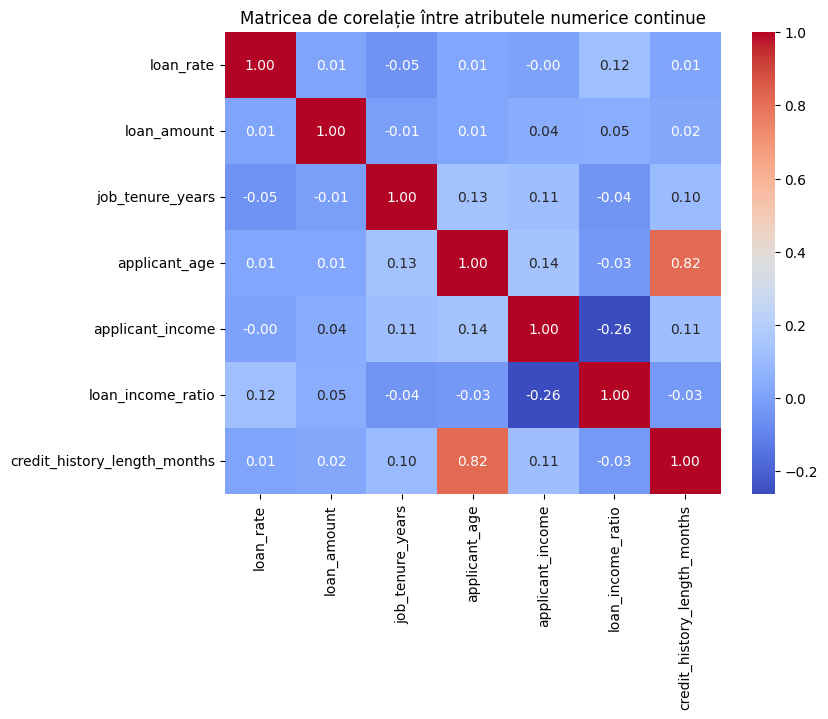

In [44]:
# observand corelatia numerica am observat ca este o corelatie puternica intre applicant_age si credit_history_length_years
# pe baza acestei observatii am decis sa elimin credit_history_length_years

df_train.drop('credit_history_length_years', axis= 1, inplace= True)
correlation_matrix_numerical = df_train.select_dtypes(include='number').corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue')
plt.show()

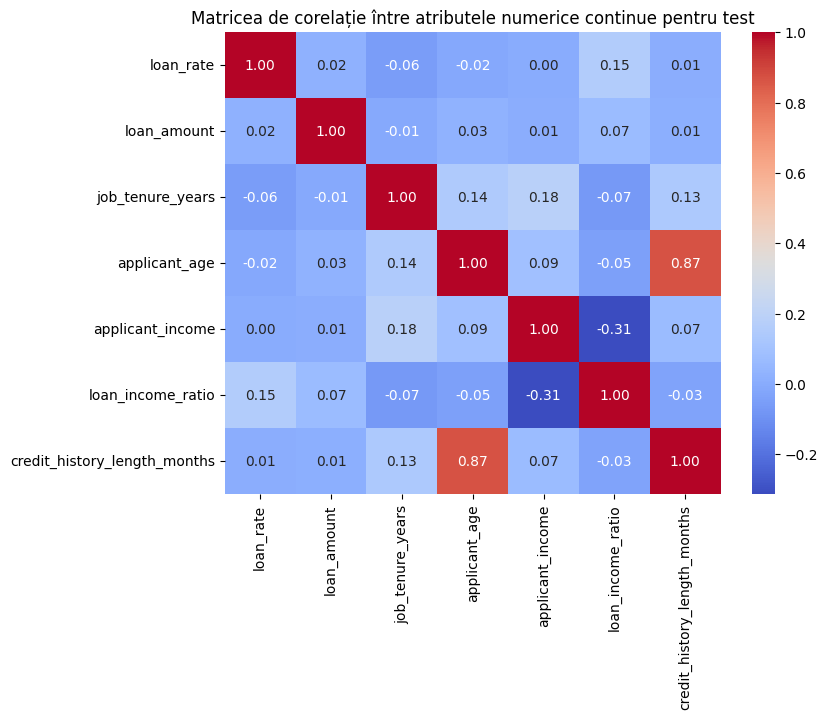

In [45]:
#test
# am facut aici la fel ca la train
df_test.drop('credit_history_length_years', axis= 1, inplace= True)
correlation_matrix_numerical_test = df_test.select_dtypes(include='number').corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical_test, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue pentru test')
plt.show()

Eliminare variabile redundante din train si test pentru Salary_Prediction

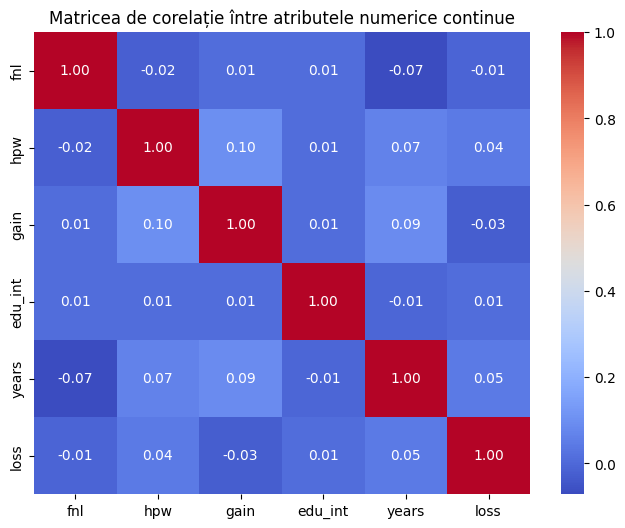

In [46]:
#train
# am observat o corelatie puternica intre prod si gain si am decis sa elimin prod
df_train_s.drop('prod', axis= 1, inplace= True)
correlation_matrix_numerical_s = df_train_s.select_dtypes(include='number').corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical_s, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue')
plt.show()

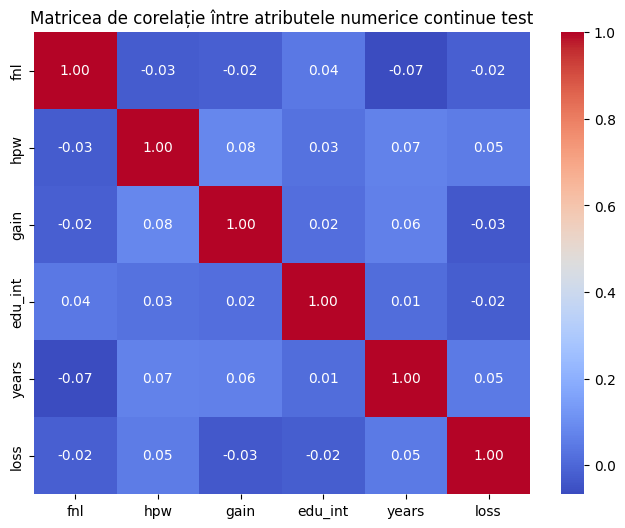

In [47]:
# test
# aici am facut la fel ca la train
df_test_s.drop('prod', axis= 1, inplace= True)
correlation_matrix_numerical_test_s = df_test_s.select_dtypes(include='number').corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_numerical_test_s, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matricea de corelație între atributele numerice continue test')
plt.show()

Standardizare pentru Credit_Risk

In [48]:
scaler = StandardScaler()

numeric_attributes_scaled = scaler.fit_transform(numeric_attributes)
numeric_attributes_scaled_df = pd.DataFrame(numeric_attributes_scaled, columns= numeric_attributes.columns)
numeric_attributes_scaled_df.fillna(numeric_attributes_scaled_df.mean(), inplace=True) # "umple" valorile lipsa cu media valorilor non-lipsa

df_train[numeric_attributes.columns] = numeric_attributes_scaled_df

print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   residential_status             8000 non-null   object 
 1   loan_rate                      8000 non-null   float64
 2   loan_amount                    8000 non-null   float64
 3   loan_purpose                   8000 non-null   object 
 4   job_tenure_years               8000 non-null   float64
 5   applicant_age                  8000 non-null   float64
 6   applicant_income               8000 non-null   float64
 7   loan_rating                    8000 non-null   object 
 8   credit_history_default_status  8000 non-null   object 
 9   loan_income_ratio              8000 non-null   float64
 10  stability_rating               8000 non-null   object 
 11  credit_history_length_months   8000 non-null   float64
 12  loan_approval_status           8000 non-null   o

In [49]:
scaler_test = StandardScaler()

numeric_attributes_scaled_test = scaler_test.fit_transform(numeric_attributes_test)
numeric_attributes_scaled_test_df = pd.DataFrame(numeric_attributes_scaled_test, columns= numeric_attributes_test.columns)
numeric_attributes_scaled_test_df.fillna(numeric_attributes_scaled_test_df.mean(), inplace=True) # "umple" valorile lipsa cu media valorilor non-lipsa

df_test[numeric_attributes_test.columns] = numeric_attributes_scaled_test_df

print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   residential_status             2000 non-null   object 
 1   loan_rate                      2000 non-null   float64
 2   loan_amount                    2000 non-null   float64
 3   loan_purpose                   2000 non-null   object 
 4   job_tenure_years               2000 non-null   float64
 5   applicant_age                  2000 non-null   float64
 6   applicant_income               2000 non-null   float64
 7   loan_rating                    2000 non-null   object 
 8   credit_history_default_status  2000 non-null   object 
 9   loan_income_ratio              2000 non-null   float64
 10  stability_rating               2000 non-null   object 
 11  credit_history_length_months   2000 non-null   float64
 12  loan_approval_status           2000 non-null   o

Standardizare pentru Salary_Prediction

In [50]:
scaler_s = StandardScaler()

numeric_attributes_s_scaled = scaler_s.fit_transform(numeric_attributes_s)
numeric_attributes_scaled_s_df = pd.DataFrame(numeric_attributes_s_scaled, columns= numeric_attributes_s.columns)
numeric_attributes_scaled_s_df.fillna(numeric_attributes_scaled_s_df.mean(), inplace=True) # "umple" valorile lipsa cu media valorilor non-lipsa

df_train_s[numeric_attributes_s.columns] = numeric_attributes_scaled_s_df

print(df_train_s.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   fnl        7999 non-null   float64
 1   hpw        7999 non-null   float64
 2   relation   7999 non-null   object 
 3   gain       7999 non-null   float64
 4   country    7999 non-null   object 
 5   job        7999 non-null   object 
 6   edu_int    7999 non-null   float64
 7   years      7999 non-null   float64
 8   loss       7999 non-null   float64
 9   work_type  7999 non-null   object 
 10  partner    7999 non-null   object 
 11  edu        7999 non-null   object 
 12  gender     7999 non-null   object 
 13  race       7999 non-null   object 
 14  gtype      7999 non-null   object 
 15  money      7999 non-null   object 
 16  prod       7999 non-null   float64
dtypes: float64(7), object(10)
memory usage: 1.0+ MB
None


In [51]:
scaler_test_s = StandardScaler()

numeric_attributes_scaled_test_s = scaler_test_s.fit_transform(numeric_attributes_test_s)
numeric_attributes_scaled_test_s_df = pd.DataFrame(numeric_attributes_scaled_test_s, columns= numeric_attributes_test_s.columns)
numeric_attributes_scaled_test_s_df.fillna(numeric_attributes_scaled_test_s_df.mean(), inplace=True) # "umple" valorile lipsa cu media valorilor non-lipsa

df_test_s[numeric_attributes_test_s.columns] = numeric_attributes_scaled_test_s_df

print(df_test_s.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   fnl        2000 non-null   float64
 1   hpw        2000 non-null   float64
 2   relation   2000 non-null   object 
 3   gain       2000 non-null   float64
 4   country    2000 non-null   object 
 5   job        2000 non-null   object 
 6   edu_int    2000 non-null   float64
 7   years      2000 non-null   float64
 8   loss       2000 non-null   float64
 9   work_type  2000 non-null   object 
 10  partner    2000 non-null   object 
 11  edu        2000 non-null   object 
 12  gender     2000 non-null   object 
 13  race       2000 non-null   object 
 14  gtype      2000 non-null   object 
 15  money      2000 non-null   object 
 16  prod       2000 non-null   float64
dtypes: float64(7), object(10)
memory usage: 265.8+ KB
None


scikit-learn model de arbore pentru Credit_Risk

In [52]:
df_train_encoded_d_tree = pd.get_dummies(df_train, columns=categorical_attributes.columns)
df_test_encoded_d_tree = pd.get_dummies(df_test, columns=categorical_attributes_test.columns)

#Ne asiguram ca avem aceleasi coloane si in train si in test
df_train_encoded_d_tree, df_test_encoded_d_tree = df_train_encoded_d_tree.align(df_test_encoded_d_tree, join='outer', axis=1, fill_value=0)


# ma asigur ca, coloana dupa care vreau sa fac splitul este de acelasi tip cu celelalte
df_train_encoded_d_tree['credit_history_length_years'] = df_train_encoded_d_tree['credit_history_length_years'].astype(int)
df_test_encoded_d_tree['credit_history_length_years'] = df_test_encoded_d_tree['credit_history_length_years'].astype(int)

# Fac Split dupa coloana selectata de mine

X_train_d_tree = df_train_encoded_d_tree.drop(columns='credit_history_length_years')  # Replace 'target' with the actual name of your target column
y_train_d_tree = df_train_encoded_d_tree['credit_history_length_years']
X_test_d_tree = df_test_encoded_d_tree.drop(columns='credit_history_length_years')
y_test_d_tree = df_test_encoded_d_tree['credit_history_length_years']

# Definesc modelul
model_d_tree = DecisionTreeClassifier()

# Antrenez modelul
model_d_tree.fit(X_train_d_tree, y_train_d_tree)

# Fac preziceri
y_pred_d_tree = model_d_tree.predict(X_test_d_tree)

# Evaluam modelul
accuracy_d_tree = accuracy_score(y_test_d_tree, y_pred_d_tree)
classification_report_d_tree = classification_report(y_test_d_tree, y_pred_d_tree)
confusion_matrix_d_tree = multilabel_confusion_matrix(y_test_d_tree, y_pred_d_tree)

print("Accuracy:", accuracy_d_tree, "\n")
print("Classification report:\n", classification_report_d_tree, "\n")
print("Confusion matrix:\n", confusion_matrix_d_tree, "\n")

Accuracy: 0.951 

Classification report:
               precision    recall  f1-score   support

           0       1.00      0.95      0.97      1700
           1       0.67      1.00      0.80       185
           2       0.96      0.91      0.93       108
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       0.60      1.00      0.75         3
           6       0.00      0.00      0.00         2

    accuracy                           0.95      2000
   macro avg       0.75      0.84      0.78      2000
weighted avg       0.97      0.95      0.95      2000
 

Confusion matrix:
 [[[ 300    0]
  [  86 1614]]

 [[1723   92]
  [   0  185]]

 [[1888    4]
  [  10   98]]

 [[1999    0]
  [   0    1]]

 [[1999    0]
  [   0    1]]

 [[1995    2]
  [   0    3]]

 [[1998    0]
  [   2    0]]] 



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 MLP scikit-learn pentru Credit_Risk

In [53]:
df_train_encoded = pd.get_dummies(df_train, columns=categorical_attributes.columns)
df_test_encoded = pd.get_dummies(df_test, columns=categorical_attributes_test.columns)

# Ne asiguram ca avem aceleasi coloane si in train si in test
df_train_encoded, df_test_encoded = df_train_encoded.align(df_test_encoded, join='outer', axis=1, fill_value=0)

df_train_encoded['credit_history_length_years'] = df_train_encoded['credit_history_length_years'].astype(int)
df_test_encoded['credit_history_length_years'] = df_test_encoded['credit_history_length_years'].astype(int)

X_train = df_train_encoded.drop(columns='credit_history_length_years')
y_train = df_train_encoded['credit_history_length_years']
X_test = df_test_encoded.drop(columns='credit_history_length_years')
y_test = df_test_encoded['credit_history_length_years']

# Definim modelul
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', random_state=42, max_iter=1000)
# intai definesc structura retelei neurale: primul strat are 100 de neuroni si al doilea 50
# functia de activare : relu care introduce non-linearitatea in model si este definita : f(x) = max(0, x)
# slover='adam' se refera la algoritmul folosit pentru optimizarea greutatilor retelei neurale am ales adam pentru ca este destul de bun pe seturi mari de date
# adam foloseste stochastic descent; face actualizări ale parametrilor pe baza gradientului calculat pentru un singur exemplu de antrenament
# in continuare sunt seed-ul de generare a numerelor randomizate si numarul maxim de iteratii pentru antrenarea modelului

# Antrenez modelul
mlp_classifier.fit(X_train, y_train)

# Facem predictii
y_pred_test = mlp_classifier.predict(X_test)

# Evaluam modelul
accuracy_test = accuracy_score(y_test, y_pred_test)
classification_report_mlp = classification_report(y_test, y_pred_test)
confusion_matrix_mlp = confusion_matrix(y_test, y_pred_test)

print("Accuracy on test set:", accuracy_test)
print("Classification report:\n", classification_report_mlp)
print("Confusion matrix:\n", confusion_matrix_mlp)

Accuracy on test set: 0.961
Classification report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98      1700
           1       0.72      0.99      0.83       185
           2       0.99      0.84      0.91       108
           3       0.00      0.00      0.00         1
           4       0.50      1.00      0.67         1
           5       0.60      1.00      0.75         3
           6       0.00      0.00      0.00         2

    accuracy                           0.96      2000
   macro avg       0.54      0.69      0.59      2000
weighted avg       0.97      0.96      0.96      2000

Confusion matrix:
 [[1644   56    0    0    0    0    0]
 [   1  183    1    0    0    0    0]
 [   0   16   91    1    0    0    0]
 [   0    0    0    0    1    0    0]
 [   0    0    0    0    1    0    0]
 [   0    0    0    0    0    3    0]
 [   0    0    0    0    0    2    0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


scikit-learn model de arbore pentru Salary_Prediction

In [54]:
df_train_encoded_s = pd.get_dummies(df_train_s, columns=categorical_attributes_s.columns)
df_test_encoded_s = pd.get_dummies(df_test_s, columns=categorical_attributes_test_s.columns)

# Ensure both train and test datasets have the same columns after encoding
# This step is essential to handle cases where some categories are present in train but not in test and vice versa
df_train_encoded_s, df_test_encoded_s = df_train_encoded_s.align(df_test_encoded_s, join='outer', axis=1, fill_value=0)

df_train_encoded_s['years'] = df_train_encoded_s['years'].astype(int)
df_test_encoded_s['years'] = df_test_encoded_s['years'].astype(int)


# Split the datasets into features and target variable
X_train_s = df_train_encoded_s.drop(columns='years')
y_train_s = df_train_encoded_s['years']
X_test_s = df_test_encoded_s.drop(columns='years')
y_test_s = df_test_encoded_s['years']

# Define the model
model = DecisionTreeClassifier()

# Train the model
model.fit(X_train_s, y_train_s)

# Make predictions
y_pred_s = model.predict(X_test_s)

# Evaluate the model
accuracy_s = accuracy_score(y_test_s, y_pred_s)
classification_report_s = classification_report(y_test_s, y_pred_s)
confusion_matrix_s = multilabel_confusion_matrix(y_test_s, y_pred_s)

# Print evaluation results
print("Accuracy:", accuracy_s, "\n")
print("Classification report:\n", classification_report_s, "\n")
print("Confusion matrix:\n", confusion_matrix_s, "\n")

Accuracy: 0.622 

Classification report:
               precision    recall  f1-score   support

          -1       0.56      0.64      0.60       376
           0       0.76      0.71      0.73      1292
           1       0.27      0.31      0.29       267
           2       0.16      0.16      0.16        57
           3       0.00      0.00      0.00         8

    accuracy                           0.62      2000
   macro avg       0.35      0.36      0.36      2000
weighted avg       0.63      0.62      0.63      2000
 

Confusion matrix:
 [[[1437  187]
  [ 137  239]]

 [[ 413  295]
  [ 380  912]]

 [[1510  223]
  [ 183   84]]

 [[1896   47]
  [  48    9]]

 [[1988    4]
  [   8    0]]] 



scikit-learn MLP pentru Salary_Prediction

In [55]:
# Cream dataframe-uri cu OneHotEncoder folosing pd.get_dummies
df_train_encoded_s_mlp = pd.get_dummies(df_train_s, columns=categorical_attributes_s.columns)
df_test_encoded_s_mlp = pd.get_dummies(df_test_s, columns=categorical_attributes_test_s.columns)

# Ne asiguram ca avem aceleasi coloane atat in train cat si in test
df_train_encoded_s_mlp, df_test_encoded_s_mlp = df_train_encoded_s_mlp.align(df_test_encoded_s_mlp, join='outer', axis=1, fill_value=0)

df_train_encoded_s_mlp['years'] = df_train_encoded_s_mlp['years'].astype(int)
df_test_encoded_s_mlp['years'] = df_test_encoded_s_mlp['years'].astype(int)

# Split the datasets into features and target variable
X_train_s_mlp = df_train_encoded_s_mlp.drop(columns='years')  # Replace 'target' with the actual name of your target column
y_train_s_mlp = df_train_encoded_s_mlp['years']
X_test_s_mlp = df_test_encoded_s_mlp.drop(columns='years')
y_test_s_mlp = df_test_encoded_s_mlp['years']

# Define the model
mlp_classifier_s = MLPClassifier(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', random_state=42, max_iter=1000)
# intai definesc structura retelei neurale: primul strat are 100 de neuroni si al doilea 50
# functia de activare : relu care introduce non-linearitatea in model si este definita : f(x) = max(0, x)
# slover='adam' se refera la algoritmul folosit pentru optimizarea greutatilor retelei neurale am ales adam pentru ca este destul de bun pe seturi mari de date
# adam foloseste stochastic descent; face actualizări ale parametrilor pe baza gradientului calculat pentru un singur exemplu de antrenament
# in continuare sunt seed-ul de generare a numerelor randomizate si numarul maxim de iteratii pentru antrenarea modelului

# Train the model
mlp_classifier_s.fit(X_train_s_mlp, y_train_s_mlp)

# Make predictions
y_pred_test_s_mlp = mlp_classifier_s.predict(X_test_s_mlp)

# Evaluate the model
accuracy_test_s_mlp = accuracy_score(y_test_s_mlp, y_pred_test_s_mlp)
classification_report_s_mlp = classification_report(y_test_s_mlp, y_pred_test_s_mlp)
confusion_matrix_s_mlp = multilabel_confusion_matrix(y_test_s_mlp, y_pred_test_s_mlp)

# Print evaluation results
print("Accuracy on test set:", accuracy_test_s_mlp)
print("Classification report:\n", classification_report_s_mlp)
print("Confusion matrix:\n", confusion_matrix_s_mlp)

Accuracy on test set: 0.6435
Classification report:
               precision    recall  f1-score   support

          -1       0.62      0.60      0.61       376
           0       0.75      0.75      0.75      1292
           1       0.27      0.28      0.28       267
           2       0.25      0.30      0.27        57
           3       0.00      0.00      0.00         8

    accuracy                           0.64      2000
   macro avg       0.38      0.39      0.38      2000
weighted avg       0.65      0.64      0.64      2000

Confusion matrix:
 [[[1484  140]
  [ 149  227]]

 [[ 389  319]
  [ 325  967]]

 [[1532  201]
  [ 191   76]]

 [[1893   50]
  [  40   17]]

 [[1989    3]
  [   8    0]]]


***PARTEA A DOUA Credit_Risk***

In [56]:
class DecisionTreeNode:
    """
    Un nod din arborele de decizie. Acesta poate fi un nod intermediar sau un nod frunză.
    """
    def __init__(self,
                 feature: Optional[str] = None,
                 children: Optional[Dict[str, DecisionTreeNode]] = None,
                 label: Optional[str] = None):
        self.split_feature = feature  # Numele atributului după care se face împărțirea (None pentru nodurile frunză)
        self.children = children if (children is not None and feature is not None) else {}
        self.label = label    # Clasa nodului frunză (None pentru nodurile intermediare)
        self.depth = 1        # Adâncimea nodului în arbore (se calculează în timpul construcției arborelui)
        self.score = 0        # Scorul nodului (se calculează în timpul construcției arborelui)
        self.num_samples = 0  # Numărul de exemple din setul de date care ajung în nodul curent

    def get_tree_graph(self,
                       graph: Digraph = None) -> Digraph:
        if graph is None:
            graph = Digraph()
            graph.attr('node', shape='box')

        if self.split_feature is None:
            # Nod frunză
            graph.node(f"{self}", f"Label: {self.label}\n"
                                  f"Score: {self.score:.3f}\n"
                                  f"Samples: {self.num_samples}",
                       fillcolor='darkolivegreen2', style='filled')
        else:
            # Nod intermediar
            graph.node(f"{self}", f"Split: {self.split_feature}?\n"
                                  f"Score: {self.score:.3f}\n"
                                  f"Samples: {self.num_samples}", fillcolor='lightblue', style='filled')

            for value, child in self.children.items():
                child.get_tree_graph(graph)
                graph.edge(f"{self}", f"{child}", label=f"{value}")

        return graph

    def display(self):
        """
        Afișează arborele de decizie folosind biblioteca Graphviz. Arborele va fi afișat ca output al celulei.
        """
        graph = self.get_tree_graph()
        idisplay(Source(graph.source))



class DecisionTree:
    def __init__(self,
                 split_strategy: str = 'random',
                 max_depth: int = np.inf,
                 min_samples_per_node: int = 1):
        self._root: DecisionTreeNode | None = None # Rădăcina arborelui
        self._split_strategy: str = split_strategy
        self._max_depth: int = max_depth
        self._min_samples_per_node: int = min_samples_per_node


    @staticmethod
    def most_frequent_class(y: pd.Series) -> str:

        majority = y.mode()

        if not majority.empty:
          return majority.iloc[0]
        else:
          return None


    @staticmethod
    def compute_entropy(y: pd.Series) -> float:

        all_examples = len(y)

        counts = y.value_counts()

        entropy = 0
        for count in counts.values:
          probability = count/all_examples
          entropy -= probability * math.log2(probability)

        return entropy


    @staticmethod
    def compute_information_gain(X: pd.DataFrame, y: pd.Series, feature: str) -> float:
        threshold = -1
        all_examples = len(y)
        # Se calculează entropia inițială a setului de date
        initial_entropy = DecisionTree.compute_entropy(y)

        # Se calculează entropia finală a setului de date
        final_entropy = 0
        # Se selectează submulțimea de exemple care au valoarea `value` pentru atributul `feature`
        types = X[feature].dtype

        if pd.api.types.is_string_dtype(types):
            for value in X[feature].unique():
                X_subset = X[X[feature] == value]
                y_subset = y[X[feature] == value]
                # Se calculează entropia submulțimii
                y_entropy = DecisionTree.compute_entropy(y_subset)
                # Se calculează ponderea submulțimii
                weight = len(y_subset) / all_examples
                # Se adaugă entropia submulțimii ponderată la entropia finală
                final_entropy += weight * y_entropy
        else:
            sorted_values = sorted(X[feature].unique())
            max_gain = -9999999999
            for value in sorted_values:
                X_subset_left = X[X[feature] <= value]
                y_subset_left = y[X[feature] <= value]
                X_subset_right = X[X[feature] > value]
                y_subset_right = y[X[feature] > value]

                entropy_left = DecisionTree.compute_entropy(y_subset_left)
                entropy_right = DecisionTree.compute_entropy(y_subset_right)

                weight_left = len(y_subset_left) / all_examples
                weight_right = len(y_subset_right) / all_examples

                final_entropy_all = weight_left * entropy_left + weight_right * entropy_right
                information_gain_final = initial_entropy - final_entropy_all

                if information_gain_final > max_gain:
                    max_gain = information_gain_final
                    threshold = value

                final_entropy = max_gain

        # Câștigul informațional se calculează ca diferența între entropia inițială și entropia finală
        information_gain = initial_entropy - final_entropy
        return information_gain, threshold


    def _select_random_split_feature(self, X: pd.DataFrame, y: pd.Series, attribute_list: list[str]) -> str:
        random_parameter = np.random.choice(attribute_list)
        return random_parameter


    def _select_best_split_feature(self, X: pd.DataFrame, y: pd.Series, attribute_list: list[str]) -> str: # aici
        best_threshold = -1
        max_gain = -99999
        best_feature = 0

        for feature in attribute_list:
          informational_gain, threshold = self.compute_information_gain(X, y, feature)
          if informational_gain > max_gain:
            max_gain = informational_gain
            best_feature = feature
            best_threshold = threshold

        return best_feature, best_threshold


    def _generate_tree(self,
                       parent_node: DecisionTreeNode | None,
                       X: pd.DataFrame,
                       y: pd.Series,
                       feature_list: list[str],
                       select_feature_func: Callable[[pd.DataFrame, pd.Series, list[str]], str]) -> DecisionTreeNode:
        # Se face o copie a listei de atribute pentru a nu modifica lista inițială
        feature_list = deepcopy(feature_list)

        # Se creează un nou nod pentru arbore
        node = DecisionTreeNode()
        node.depth = parent_node.depth + 1 if parent_node is not None else 0
        node.score = DecisionTree.compute_entropy(y)
        node.num_samples = len(y)
        node.label = DecisionTree.most_frequent_class(y)

        if(node.depth == self._max_depth or y.nunique() == 1 or node.num_samples <= MIN_SAMPLES_PER_NODE or not feature_list):
          return node

        attribute, best_threshold = select_feature_func(X, y, feature_list)
        node.split_feature = attribute
        feature_list.remove(attribute)

        types = X[attribute].dtype

        if pd.api.types.is_numeric_dtype(types):
            left = X[X[attribute] <= best_threshold]
            sub_y_left = y[X[attribute] <= best_threshold]
            child_node_left = self._generate_tree(parent_node=node,
                                              X=left,
                                              y=sub_y_left,
                                              feature_list=feature_list,
                                              select_feature_func=select_feature_func)
            node.children['<= {}'.format(best_threshold)] = child_node_left

            right = X[X[attribute] > best_threshold]
            sub_y_right = y[X[attribute] > best_threshold]
            child_node_right = self._generate_tree(parent_node=node,
                                              X=right,
                                              y=sub_y_right,
                                              feature_list=feature_list,
                                              select_feature_func=select_feature_func)
            node.children['> {}'.format(best_threshold)] = child_node_right

        else:
            for value in X[attribute].unique():
                sub_X = X[X[attribute] == value]
                sub_y = y[X[attribute] == value]

                child_node = self._generate_tree(parent_node=node,
                                            X=sub_X,
                                            y=sub_y,
                                            feature_list=feature_list,
                                            select_feature_func=select_feature_func)
                node.children[value] = child_node


        return node


    def fit(self, X: pd.DataFrame, y: pd.Series):
        # Selectează funcția de împărțire a nodurilor
        if self._split_strategy == 'random':
            select_feature_func = self._select_random_split_feature
        elif self._split_strategy == 'id3':
            select_feature_func = self._select_best_split_feature
        else:
            raise ValueError(f"Unknown split strategy {self._split_strategy}")

        self._root = self._generate_tree(parent_node=None,
                                         X=X,
                                         y=y,
                                         feature_list=X.columns.tolist(),
                                         select_feature_func=select_feature_func)

    def _predict_once(self, x: pd.Series) -> str:
        node = self._root

        while node.split_feature is not None:
            if node.split_feature not in x:
                break
            type_feature = x[node.split_feature].dtype
            if node.split_feature in x and x[node.split_feature] in node.children and pd.api.types.is_string_dtype(type_feature):
                node = node.children[x[node.split_feature]]
            elif node.split_feature in x and x[node.split_feature] in node.children and pd.api.types.is_numeric_dtype(type_feature):
                value = x[node.split_feature]
                if value <= node.split_value:
                    node = node.children['<= {}'.format(value)]
                else:
                    node = node.children['> {}'.format(value)]
            else:
                break
        return node.label

    def predict(self, X: pd.DataFrame) -> np.ndarray:
        return np.array([self._predict_once(x) for _, x in X.iterrows()])

    def get_depth(self) -> int:
        # Se parcurge arborele pentru a găsi adâncimea maximă
        def _get_depth(node: DecisionTreeNode) -> int:
            if node is None:
                return 0
            return max([_get_depth(child) for child in node.children.values()], default=0) + 1

        return _get_depth(self._root)

    def get_number_of_nodes(self) -> int:
        # Se parcurge arborele pentru a găsi numărul de noduri
        def _get_number_of_nodes(node: DecisionTreeNode) -> int:
            if node is None:
                return 0
            return sum([_get_number_of_nodes(child) for child in node.children.values()], 0) + 1

        return _get_number_of_nodes(self._root)

    def get_tree_graph(self) -> Digraph:
        return self._root.get_tree_graph()

    def display(self):
        return self._root.display()


def precision(y_pred: pd.Series, y_true: pd.Series, c: str) -> float:
    # Doar exemplele clasificate cu clasa c sunt relevante pentru calculul preciziei
    pred_c = y_pred[y_pred == c]

    # Extrage doar exemplele clasificate corect cu clasa c
    true_c = y_true[(y_pred == c) & (y_true == c)]

    # Calculul preciziei
    if len(pred_c) == 0:
        return 0
    else:
        return len(true_c) / len(pred_c)

def recall(y_pred: pd.Series, y_true: pd.Series, c: str) -> float:
    # Doar exemplele din setul de date cu clasa c sunt relevante pentru calculul acoperirii
    true_c = y_true[y_true == c]

    # Extrage doar exemplele clasificate corect cu clasa c
    pred_c = y_pred[(y_pred == c) & (y_true == c)]

    # Calculul acoperirii
    if len(true_c) == 0:
        return 0
    else:
        return len(pred_c) / len(true_c)

def f1_score(y_pred: pd.Series, y_true: pd.Series, c: str) -> float:
    # Calculul scorului F1
    p = precision(y_pred, y_true, c)
    r = recall(y_pred, y_true, c)

    if p + r == 0:
        return 0
    else:
        return 2 * p * r / (p + r)

def accuracy(y_pred: pd.Series, y_true: pd.Series) -> float:
    # Calculul acurateței
    return (y_pred == y_true).sum() / len(y_true)

def evaluate(tree: DecisionTree, X: pd.DataFrame, y: pd.Series):
    from sklearn.metrics import classification_report

    y_pred = tree.predict(X)
    print(classification_report(y, y_pred, zero_division=0))

def plot_confusion_matrix(y_pred: pd.Series, y_true: pd.Series):
    confusion_matrix = pd.crosstab(y_true, y_pred, rownames=['Actual'], colnames=['Predicted'], dropna=False)

    all_classes = np.unique(list(y_true) + list(y_pred))
    confusion_matrix = confusion_matrix.reindex(index=all_classes, columns=all_classes, fill_value=0)

if __name__ == "__main__":
    all_train = numeric_attributes.columns.union(categorical_attributes.columns)
    all_test = numeric_attributes_test.columns.union(categorical_attributes_test.columns)

    Series_train = pd.Series(all_train)
    Series_Test = pd.Series(all_test)

    tree = DecisionTree(split_strategy= 'id3', max_depth=np.inf, min_samples_per_node=MIN_SAMPLES_PER_NODE)
    tree.fit(df_train.loc[:, df_train.columns != 'loan_approval_status'], df_train['loan_approval_status'])


    tree.display()



***PARTEA A DOUA Salary_Prediction***

In [57]:
class DecisionTreeNode:
    """
    Un nod din arborele de decizie. Acesta poate fi un nod intermediar sau un nod frunză.
    """
    def __init__(self,
                 feature: Optional[str] = None,
                 children: Optional[Dict[str, DecisionTreeNode]] = None,
                 label: Optional[str] = None):
        self.split_feature = feature  # Numele atributului după care se face împărțirea (None pentru nodurile frunză)
        self.children = children if (children is not None and feature is not None) else {}
        self.label = label    # Clasa nodului frunză (None pentru nodurile intermediare)
        self.depth = 1        # Adâncimea nodului în arbore (se calculează în timpul construcției arborelui)
        self.score = 0        # Scorul nodului (se calculează în timpul construcției arborelui)
        self.num_samples = 0  # Numărul de exemple din setul de date care ajung în nodul curent

    def get_tree_graph(self,
                       graph: Digraph = None) -> Digraph:
        if graph is None:
            graph = Digraph()
            graph.attr('node', shape='box')

        if self.split_feature is None:
            # Nod frunză
            graph.node(f"{self}", f"Label: {self.label}\n"
                                  f"Score: {self.score:.3f}\n"
                                  f"Samples: {self.num_samples}",
                       fillcolor='darkolivegreen2', style='filled')
        else:
            # Nod intermediar
            graph.node(f"{self}", f"Split: {self.split_feature}?\n"
                                  f"Score: {self.score:.3f}\n"
                                  f"Samples: {self.num_samples}", fillcolor='lightblue', style='filled')

            for value, child in self.children.items():
                child.get_tree_graph(graph)
                graph.edge(f"{self}", f"{child}", label=f"{value}")

        return graph

    def display(self):
        """
        Afișează arborele de decizie folosind biblioteca Graphviz. Arborele va fi afișat ca output al celulei.
        """
        graph = self.get_tree_graph()
        idisplay(Source(graph.source))



class DecisionTree:
    def __init__(self,
                 split_strategy: str = 'random',
                 max_depth: int = np.inf,
                 min_samples_per_node: int = 1):
        self._root: DecisionTreeNode | None = None # Rădăcina arborelui
        self._split_strategy: str = split_strategy
        self._max_depth: int = max_depth
        self._min_samples_per_node: int = min_samples_per_node


    @staticmethod
    def most_frequent_class(y: pd.Series) -> str:

        majority = y.mode()

        if not majority.empty:
          return majority.iloc[0]
        else:
          return None


    @staticmethod
    def compute_entropy(y: pd.Series) -> float:

        all_examples = len(y)

        counts = y.value_counts()

        entropy = 0
        for count in counts.values:
          probability = count/all_examples
          entropy -= probability * math.log2(probability)

        return entropy


    @staticmethod
    def compute_information_gain(X: pd.DataFrame, y: pd.Series, feature: str) -> float:
        threshold = -1
        all_examples = len(y)
        # Se calculează entropia inițială a setului de date
        initial_entropy = DecisionTree.compute_entropy(y)

        # Se calculează entropia finală a setului de date
        final_entropy = 0
        # Se selectează submulțimea de exemple care au valoarea `value` pentru atributul `feature`
        types = X[feature].dtype

        if pd.api.types.is_string_dtype(types):
            for value in X[feature].unique():
                X_subset = X[X[feature] == value]
                y_subset = y[X[feature] == value]
                # Se calculează entropia submulțimii
                y_entropy = DecisionTree.compute_entropy(y_subset)
                # Se calculează ponderea submulțimii
                weight = len(y_subset) / all_examples
                # Se adaugă entropia submulțimii ponderată la entropia finală
                final_entropy += weight * y_entropy
        else:
            sorted_values = sorted(X[feature].unique())
            max_gain = -9999999999
            for value in sorted_values:
                X_subset_left = X[X[feature] <= value]
                y_subset_left = y[X[feature] <= value]
                X_subset_right = X[X[feature] > value]
                y_subset_right = y[X[feature] > value]

                entropy_left = DecisionTree.compute_entropy(y_subset_left)
                entropy_right = DecisionTree.compute_entropy(y_subset_right)

                weight_left = len(y_subset_left) / all_examples
                weight_right = len(y_subset_right) / all_examples

                final_entropy_all = weight_left * entropy_left + weight_right * entropy_right
                information_gain_final = initial_entropy - final_entropy_all

                if information_gain_final > max_gain:
                    max_gain = information_gain_final
                    threshold = value

                final_entropy = max_gain

        # Câștigul informațional se calculează ca diferența între entropia inițială și entropia finală
        information_gain = initial_entropy - final_entropy
        return information_gain, threshold


    def _select_random_split_feature(self, X: pd.DataFrame, y: pd.Series, attribute_list: list[str]) -> str:
        random_parameter = np.random.choice(attribute_list)
        return random_parameter


    def _select_best_split_feature(self, X: pd.DataFrame, y: pd.Series, attribute_list: list[str]) -> str: # aici
        best_threshold = -1
        max_gain = -99999
        best_feature = 0

        for feature in attribute_list:
          informational_gain, threshold = self.compute_information_gain(X, y, feature)
          if informational_gain > max_gain:
            max_gain = informational_gain
            best_feature = feature
            best_threshold = threshold

        return best_feature, best_threshold


    def _generate_tree(self,
                       parent_node: DecisionTreeNode | None,
                       X: pd.DataFrame,
                       y: pd.Series,
                       feature_list: list[str],
                       select_feature_func: Callable[[pd.DataFrame, pd.Series, list[str]], str]) -> DecisionTreeNode:
        # Se face o copie a listei de atribute pentru a nu modifica lista inițială
        feature_list = deepcopy(feature_list)

        # Se creează un nou nod pentru arbore
        node = DecisionTreeNode()
        node.depth = parent_node.depth + 1 if parent_node is not None else 0
        node.score = DecisionTree.compute_entropy(y)
        node.num_samples = len(y)
        node.label = DecisionTree.most_frequent_class(y)

        if(node.depth == self._max_depth or y.nunique() == 1 or node.num_samples <= MIN_SAMPLES_PER_NODE or not feature_list):
          return node

        attribute, best_threshold = select_feature_func(X, y, feature_list)
        node.split_feature = attribute
        feature_list.remove(attribute)

        types = X[attribute].dtype

        if pd.api.types.is_numeric_dtype(types):
            left = X[X[attribute] <= best_threshold]
            sub_y_left = y[X[attribute] <= best_threshold]
            child_node_left = self._generate_tree(parent_node=node,
                                              X=left,
                                              y=sub_y_left,
                                              feature_list=feature_list,
                                              select_feature_func=select_feature_func)
            node.children['<= {}'.format(best_threshold)] = child_node_left

            right = X[X[attribute] > best_threshold]
            sub_y_right = y[X[attribute] > best_threshold]
            child_node_right = self._generate_tree(parent_node=node,
                                              X=right,
                                              y=sub_y_right,
                                              feature_list=feature_list,
                                              select_feature_func=select_feature_func)
            node.children['> {}'.format(best_threshold)] = child_node_right

        else:
            for value in X[attribute].unique():
                sub_X = X[X[attribute] == value]
                sub_y = y[X[attribute] == value]

                child_node = self._generate_tree(parent_node=node,
                                            X=sub_X,
                                            y=sub_y,
                                            feature_list=feature_list,
                                            select_feature_func=select_feature_func)
                node.children[value] = child_node


        return node


    def fit(self, X: pd.DataFrame, y: pd.Series):
        # Selectează funcția de împărțire a nodurilor
        if self._split_strategy == 'random':
            select_feature_func = self._select_random_split_feature
        elif self._split_strategy == 'id3':
            select_feature_func = self._select_best_split_feature
        else:
            raise ValueError(f"Unknown split strategy {self._split_strategy}")

        self._root = self._generate_tree(parent_node=None,
                                         X=X,
                                         y=y,
                                         feature_list=X.columns.tolist(),
                                         select_feature_func=select_feature_func)

    def _predict_once(self, x: pd.Series) -> str:
        node = self._root

        while node.split_feature is not None:
            if node.split_feature not in x:
                break
            type_feature = x[node.split_feature].dtype
            if node.split_feature in x and x[node.split_feature] in node.children and pd.api.types.is_string_dtype(type_feature):
                node = node.children[x[node.split_feature]]
            elif node.split_feature in x and x[node.split_feature] in node.children and pd.api.types.is_numeric_dtype(type_feature):
                value = x[node.split_feature]
                if value <= node.split_value:
                    node = node.children['<= {}'.format(value)]
                else:
                    node = node.children['> {}'.format(value)]
            else:
                break
        return node.label

    def predict(self, X: pd.DataFrame) -> np.ndarray:
        return np.array([self._predict_once(x) for _, x in X.iterrows()])

    def get_depth(self) -> int:
        # Se parcurge arborele pentru a găsi adâncimea maximă
        def _get_depth(node: DecisionTreeNode) -> int:
            if node is None:
                return 0
            return max([_get_depth(child) for child in node.children.values()], default=0) + 1

        return _get_depth(self._root)

    def get_number_of_nodes(self) -> int:
        # Se parcurge arborele pentru a găsi numărul de noduri
        def _get_number_of_nodes(node: DecisionTreeNode) -> int:
            if node is None:
                return 0
            return sum([_get_number_of_nodes(child) for child in node.children.values()], 0) + 1

        return _get_number_of_nodes(self._root)

    def get_tree_graph(self) -> Digraph:
        return self._root.get_tree_graph()

    def display(self):
        return self._root.display()


def precision(y_pred: pd.Series, y_true: pd.Series, c: str) -> float:
    # Doar exemplele clasificate cu clasa c sunt relevante pentru calculul preciziei
    pred_c = y_pred[y_pred == c]

    # Extrage doar exemplele clasificate corect cu clasa c
    true_c = y_true[(y_pred == c) & (y_true == c)]

    # Calculul preciziei
    if len(pred_c) == 0:
        return 0
    else:
        return len(true_c) / len(pred_c)

def recall(y_pred: pd.Series, y_true: pd.Series, c: str) -> float:
    # Doar exemplele din setul de date cu clasa c sunt relevante pentru calculul acoperirii
    true_c = y_true[y_true == c]

    # Extrage doar exemplele clasificate corect cu clasa c
    pred_c = y_pred[(y_pred == c) & (y_true == c)]

    # Calculul acoperirii
    if len(true_c) == 0:
        return 0
    else:
        return len(pred_c) / len(true_c)

def f1_score(y_pred: pd.Series, y_true: pd.Series, c: str) -> float:
    # Calculul scorului F1
    p = precision(y_pred, y_true, c)
    r = recall(y_pred, y_true, c)

    if p + r == 0:
        return 0
    else:
        return 2 * p * r / (p + r)

def accuracy(y_pred: pd.Series, y_true: pd.Series) -> float:
    # Calculul acurateței
    return (y_pred == y_true).sum() / len(y_true)

def evaluate(tree: DecisionTree, X: pd.DataFrame, y: pd.Series):
    from sklearn.metrics import classification_report

    y_pred = tree.predict(X)
    #print(classification_report(y, y_pred, zero_division=0))

def plot_confusion_matrix(y_pred: pd.Series, y_true: pd.Series):
    confusion_matrix = pd.crosstab(y_true, y_pred, rownames=['Actual'], colnames=['Predicted'], dropna=False)

    all_classes = np.unique(list(y_true) + list(y_pred))
    confusion_matrix = confusion_matrix.reindex(index=all_classes, columns=all_classes, fill_value=0)

if __name__ == "__main__":
    all_train_s = numeric_attributes_s.columns.union(categorical_attributes_s.columns)
    all_test_s = numeric_attributes_test_s.columns.union(categorical_attributes_test_s.columns)

    Series_train_s = pd.Series(all_train_s)
    Series_Test_s = pd.Series(all_test_s)

    tree_s = DecisionTree(split_strategy= 'id3', max_depth=np.inf, min_samples_per_node=MIN_SAMPLES_PER_NODE)
    tree_s.fit( df_train_s.loc[:, df_train_s.columns != 'money'], df_train_s['money'])


    tree_s.display()



***MLP***

In [58]:
# !pip install mnist
# import mnist

import gzip
import sys
import pickle

import urllib.request

url = "https://s3.amazonaws.com/img-datasets/mnist.pkl.gz"
filename = "mnist.pkl.gz"

urllib.request.urlretrieve(url, filename)


f = gzip.open('mnist.pkl.gz', 'rb')
if sys.version_info < (3,):
    data = pickle.load(f)
else:
    data = pickle.load(f, encoding='bytes')
f.close()
(train_imgs, train_labels), (test_imgs, test_labels) = data



In [59]:
mean, std  = train_imgs.mean(), train_imgs.std()
train_imgs = (train_imgs - mean) / std
test_imgs = (test_imgs - mean) / std

In [60]:
values_nd_array = numeric_attributes.values

class Layer:

    def forward(self, x: np.ndarray) -> np.ndarray:
        raise NotImplementedError

    def backward(self, x: np.ndarray, dy: np.ndarray) -> np.ndarray:
        raise NotImplementedError

    def update(self, *args, **kwargs):
        pass  # If a layer has no parameters, then this function does nothing

In [64]:
class FeedForwardNetwork:

    def __init__(self, layers: List[Layer]):
        self.layers = layers

    def forward(self, x: np.ndarray, train: bool = True) -> np.ndarray:
        self._inputs = []
        for layer in self.layers:
            if train:
                self._inputs.append(x)
            x = layer.forward(x)
        return x

    def backward(self, dy: np.ndarray) -> np.ndarray:
        dx = dy
        for layer, input in zip(reversed(self.layers), reversed(self._inputs)):
          dx = layer.backward(input, dx)
        return dx
        del self._inputs

    def update(self, *args, **kwargs):
        for layer in self.layers:
            layer.update(*args, **kwargs)

In [65]:
class Linear(Layer):

    def __init__(self, insize: int, outsize: int) -> None:
        bound = np.sqrt(6. / insize)
        self.weight = np.random.uniform(-bound, bound, (insize, outsize))
        self.bias = np.zeros((outsize,))

        self.dweight = np.zeros_like(self.weight)
        self.dbias = np.zeros_like(self.bias)

    def forward(self, x: np.ndarray) -> np.ndarray:
        result = np.dot(x, self.weight) + self.bias
        return result

    def backward(self, x: np.ndarray, dy: np.ndarray) -> np.ndarray:
        self.dweight = np.dot(x.T, dy)
        self.dbias = np.sum(dy, axis = 0)
        dx = np.dot(dy, self.weight.T)
        return dx

    def update(self, mode='SGD', lr=0.001, mu=0.9):
        if mode == 'SGD':
            self.weight -= lr * self.dweight
            self.bias -= lr * self.dbias
        else:
            raise ValueError('mode should be SGD, not ' + str(mode))

In [66]:
class ReLU(Layer):

    def __init__(self) -> None:
        pass

    def forward(self, x: np.ndarray) -> np.ndarray:
        return np.maximum(0, x)

    def backward(self, x: np.ndarray, dy: np.ndarray) -> np.ndarray:
        return np.where(x <= 0, 0, 1) * dy

In [67]:
class CrossEntropy:

    def __init__(self):
        pass

    def softmax(self, x):
        if isinstance(x, np.ndarray) and np.issubdtype(x.dtype, np.number):
            exps = np.exp(x)
            return exps / np.sum(exps, axis=1).reshape(-1, 1)
        else:
            raise TypeError("Input must be a numeric numpy array")

    def forward(self, y: np.ndarray, t: np.ndarray) -> float:
        probabilities = self.softmax(y)
        selected = probabilities[np.arange(len(probabilities)), t.reshape(-1, 1)]
        result = -np.sum(np.log(selected)) / len(selected)
        return result

    def backward(self, y: np.ndarray, t: np.ndarray) -> np.ndarray:
        probabs = self.softmax(y)
        B = y.shape[0]
        dL_dy = probabs.copy()
        dL_dy[np.arange(B), t] -= 1
        dL_dy /= B

        return dL_dy

In [68]:
def accuracy_mlp(y: np.ndarray, t: np.ndarray) -> float:
    # - folosiți np.argmax() pentru a afla predictiile retelei
    predictions = np.argmax(y, axis=1)
    # - folositi np.sum() pentru a numara cate sunt corecte comparand cu ground truth (t)
    correct_predictions = np.sum(predictions == t)
    # - impartiti la batch size pentru a calcula valoarea medie peste toate exemplele din batch
    accuracy = correct_predictions / y.shape[0]
    return accuracy

# ***ANTRENAREA RETELEI NEURALE***

**Credit_Risk**

In [75]:
BATCH_SIZE = 128
HIDDEN_UNITS = 300
EPOCHS_NO = 20


df_train_encoded_d_tree['loan_approval_status_Declined'] = df_train_encoded_d_tree['loan_approval_status_Declined'].astype(int)
df_test_encoded_d_tree['loan_approval_status_Declined'] = df_test_encoded_d_tree['loan_approval_status_Declined'].astype(int)

# Fac Split dupa coloana selectata de mine

X_train_d_tree = df_train_encoded_d_tree.drop(columns='loan_approval_status_Declined')
y_train_d_tree = df_train_encoded_d_tree['loan_approval_status_Declined']
X_test_d_tree = df_test_encoded_d_tree.drop(columns='loan_approval_status_Declined')
y_test_d_tree = df_test_encoded_d_tree['loan_approval_status_Declined']

optimize_args = {'mode': 'SGD', 'lr': .005}

net = FeedForwardNetwork([Linear(X_train_d_tree.shape[1], HIDDEN_UNITS),
                          ReLU(),
                          Linear(HIDDEN_UNITS, 10)])
cost_function = CrossEntropy()


for epoch in range(EPOCHS_NO):
    for b_no, start_idx in enumerate(range(0, X_train_d_tree.shape[1], BATCH_SIZE)):
        end_idx = start_idx + BATCH_SIZE
        x_batch = X_train_d_tree.iloc[start_idx:end_idx].values.astype(int)
        t_batch = y_train_d_tree.iloc[start_idx:end_idx].values.astype(int)
        t_batch = t_batch.astype(int)

        x_batch = x_batch.reshape(-1, X_train_d_tree.shape[1])

        # Propagarea înainte
        y_pred = net.forward(x_batch)
        loss = cost_function.forward(y_pred, t_batch)
        dy = cost_function.backward(y_pred, t_batch)
        net.backward(dy)

        # Actualizarea parametrilor
        net.update(**optimize_args)
        acc = accuracy_mlp(y_pred, t_batch)
        #acc_train = acc.astype(float)

        print(f'\rEpoch {epoch + 1:02d} '
              f'| Batch {b_no:03d} '
              f'| Train NLL: {loss:6.3f} '
              f'| Train Acc: {acc * 100:6.2f}% ', end='')

    y_test_pred = net.forward(X_test_d_tree.values.reshape(-1, X_test_d_tree.shape[1]), train=False).astype(int)  # test
    test_batch = y_test_d_tree.values.flatten().astype(int)
    test_nll = cost_function.forward(y_test_pred, test_batch)
    print(f'| Test NLL: {test_nll:6.3f} '
          f'| Test Acc: {accuracy_mlp(y_test_pred, test_batch) * 100:3.2f}%')

Epoch 01 | Batch 000 | Train NLL: 375.774 | Train Acc:   0.78% | Test NLL: 5116.553 | Test Acc: 28.05%
Epoch 02 | Batch 000 | Train NLL: 359.723 | Train Acc:   4.69% | Test NLL: 4964.894 | Test Acc: 32.45%
Epoch 03 | Batch 000 | Train NLL: 344.194 | Train Acc:   7.81% | Test NLL: 4823.250 | Test Acc: 37.05%
Epoch 04 | Batch 000 | Train NLL: 329.225 | Train Acc:  10.16% | Test NLL: 4678.037 | Test Acc: 40.90%
Epoch 05 | Batch 000 | Train NLL: 314.852 | Train Acc:  14.06% | Test NLL: 4538.959 | Test Acc: 45.00%
Epoch 06 | Batch 000 | Train NLL: 301.108 | Train Acc:  17.97% | Test NLL: 4409.747 | Test Acc: 48.55%
Epoch 07 | Batch 000 | Train NLL: 288.024 | Train Acc:  27.34% | Test NLL: 4243.748 | Test Acc: 53.05%
Epoch 08 | Batch 000 | Train NLL: 275.624 | Train Acc:  36.72% | Test NLL: 4090.297 | Test Acc: 57.00%
Epoch 09 | Batch 000 | Train NLL: 263.927 | Train Acc:  46.09% | Test NLL: 3948.422 | Test Acc: 60.70%
Epoch 10 | Batch 000 | Train NLL: 252.941 | Train Acc:  52.34% | Test NLL

**Salary_Predict**

In [73]:
BATCH_SIZE = 128
HIDDEN_UNITS = 300
EPOCHS_NO = 20

df_train_encoded_s['money_>50K'] = df_train_encoded_s['money_>50K'].astype(int)
df_test_encoded_s['money_>50K'] = df_test_encoded_s['money_>50K'].astype(int)

X_train_s = df_train_encoded_s.drop(columns='money_>50K')
y_train_s = df_train_encoded_s['money_>50K'].fillna(df_train_encoded_s['money_>50K'].mean())
X_test_s = df_test_encoded_s.drop(columns='money_>50K')
y_test_s = df_test_encoded_s['money_>50K'].fillna(df_test_encoded_s['money_>50K'].mean())
optimize_args = {'mode': 'SGD', 'lr': .005}

net = FeedForwardNetwork([Linear(X_train_s.shape[1], HIDDEN_UNITS),
                          ReLU(),
                          Linear(HIDDEN_UNITS, 10)])
cost_function = CrossEntropy()


for epoch in range(EPOCHS_NO):
    for b_no, start_idx in enumerate(range(0, X_train_s.shape[1], BATCH_SIZE)):
        end_idx = start_idx + BATCH_SIZE
        x_batch = X_train_s.iloc[start_idx:end_idx].values.astype(int)
        t_batch = y_train_s.iloc[start_idx:end_idx].values.astype(int)

        y_pred = net.forward(x_batch)
        loss = cost_function.forward(y_pred, t_batch)
        dy = cost_function.backward(y_pred, t_batch)
        net.backward(dy)

        # Actualizarea parametrilor
        net.update(**optimize_args)
        acc = accuracy_mlp(y_pred, t_batch)

        print(f'\rEpoch {epoch + 1:02d} '
              f'| Batch {b_no:03d} '
              f'| Train NLL: {loss:6.3f} '
              f'| Train Acc: {acc * 100:6.2f}% ', end='')

    y_test_pred = net.forward(X_test_s.values.reshape(-1, X_test_s.shape[1]), train=False).astype(int)
    test_batch = y_test_s.values.flatten().astype(int)
    test_nll = cost_function.forward(y_test_pred, test_batch)
    print(f'| Test NLL: {test_nll:6.3f} '
          f'| Test Acc: {accuracy_mlp(y_test_pred, test_batch) * 100:3.2f}%')


Epoch 01 | Batch 000 | Train NLL: 303.576 | Train Acc:   7.81% | Test NLL: 4607.832 | Test Acc: 68.55%
Epoch 02 | Batch 000 | Train NLL: 296.488 | Train Acc:  10.94% | Test NLL: 4601.216 | Test Acc: 68.90%
Epoch 03 | Batch 000 | Train NLL: 289.543 | Train Acc:  10.94% | Test NLL: 4593.666 | Test Acc: 69.30%
Epoch 04 | Batch 000 | Train NLL: 282.744 | Train Acc:  12.50% | Test NLL: 4581.665 | Test Acc: 70.05%
Epoch 05 | Batch 000 | Train NLL: 276.093 | Train Acc:  16.41% | Test NLL: 4566.838 | Test Acc: 70.35%
Epoch 06 | Batch 000 | Train NLL: 269.594 | Train Acc:  17.97% | Test NLL: 4556.052 | Test Acc: 70.55%
Epoch 07 | Batch 000 | Train NLL: 263.251 | Train Acc:  24.22% | Test NLL: 4530.549 | Test Acc: 70.95%
Epoch 08 | Batch 000 | Train NLL: 257.064 | Train Acc:  28.91% | Test NLL: 4503.762 | Test Acc: 71.50%
Epoch 09 | Batch 000 | Train NLL: 251.038 | Train Acc:  33.59% | Test NLL: 4457.402 | Test Acc: 72.15%
Epoch 10 | Batch 000 | Train NLL: 245.174 | Train Acc:  39.06% | Test NLL